### Import Necessary Data

In [32]:
import os
import mne
import csv
import torch
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
from meegkit.asr import ASR
from autoreject import AutoReject
from joblib import Parallel, delayed

from mne.preprocessing import ICA
from mne_icalabel import label_components

from scipy.stats import kurtosis
from scipy.fft import rfft, rfftfreq
from scipy.signal import butter, sosfiltfilt

In [21]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


### Load Data

In [22]:
def load_data(filepath, required_channels=14, sample_length=256, max_samples_per_digit=6500):
    eeg_data = []
    digit_labels = []
    samples_per_class = [0] * 10

    CHANNEL_NAMES = ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
                     "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"]

    current_channels = {}
    current_digit = None

    with open(filepath, 'r') as file:
        reader = csv.reader(file, delimiter='\t')
        for row in reader:
            if len(row) < 7:
                continue

            try:
                digit_code = int(row[4])
                channel_name = row[3].strip()
                signal_values = row[6].split(',')
            except (ValueError, IndexError):
                continue

            if digit_code < 0 or digit_code > 9:
                continue
            if samples_per_class[digit_code] >= max_samples_per_digit:
                continue
            if channel_name not in CHANNEL_NAMES:
                continue
            if len(signal_values) < sample_length:
                continue

            signal_array = np.array(signal_values[:sample_length], dtype=np.float32)

            if len(current_channels) == 0:
                current_digit = digit_code

            if digit_code == current_digit and channel_name not in current_channels:
                current_channels[channel_name] = signal_array

            if len(current_channels) == required_channels:
                # Ensure correct channel order
                if all(ch in current_channels for ch in CHANNEL_NAMES):
                    ordered_channels = [current_channels[ch] for ch in CHANNEL_NAMES]
                    eeg_data.append(np.array(ordered_channels))
                    digit_labels.append(current_digit)
                    samples_per_class[current_digit] += 1
                current_channels = {}

                if sum(samples_per_class) % 1000 == 0:
                    print(f"{sum(samples_per_class)} samples collected...")

            if all(count >= max_samples_per_digit for count in samples_per_class):
                break

    eeg_data = np.array(eeg_data)
    digit_labels = np.array(digit_labels)

    print(f"\nLoaded EEG shape: {eeg_data.shape} (samples, channels, time)")
    for i in range(10):
        print(f" - Digit {i}: {samples_per_class[i]} samples")

    return eeg_data, digit_labels, samples_per_class

### Bandpass filter 

In [23]:
def butter_bandpass(lowcut, highcut, fs, order=8):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    sos = butter(order, [low, high], btype='band', output='sos')
    return sos

def apply_bandpass_filter(signal, lowcut, highcut, fs, order=8):
    sos = butter_bandpass(lowcut, highcut, fs, order)
    return sosfiltfilt(sos, signal, axis=-1)

def bandpass_all_trials(x_data, fs=128, lowcut=1, highcut=40, order=8):
    n_trials, n_channels, n_samples = x_data.shape
    x_filtered = np.zeros_like(x_data)

    for i in tqdm(range(n_trials), desc="Filtering Trials"):
        for ch in range(n_channels):
            x_filtered[i, ch] = apply_bandpass_filter(x_data[i, ch], lowcut, highcut, fs, order)

    return x_filtered


In [24]:
def plot_fft_before_after(signal_raw, signal_filt, fs, channel_name="Channel"):
    # Window to reduce leakage
    window = np.hanning(len(signal_raw))
    raw_win = signal_raw * window
    filt_win = signal_filt * window

    # Compute FFT
    fft_raw = np.abs(rfft(raw_win))
    fft_filt = np.abs(rfft(filt_win))

    # Convert to dB scale
    eps = 1e-10
    psd_raw = 20 * np.log10(fft_raw + eps)
    psd_filt = 20 * np.log10(fft_filt + eps)

    freqs = rfftfreq(len(signal_raw), 1 / fs)

    # Plot
    plt.figure(figsize=(12, 4))
    plt.plot(freqs, psd_raw, label="Original", color="blue")
    plt.plot(freqs, psd_filt, label="Filtered", color="orange")
    plt.title(f"Power Spectrum Before vs After Filtering ({channel_name})")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power Spectrum (dB)")
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


### Convert to MNE array 

In [25]:
def to_mne_raw(trial, ch_names, fs=128):
    # Remove DC offset and scale
    trial_centered = trial - np.mean(trial, axis=1, keepdims=True)
    trial_volt = trial_centered / 1e6  # convert to Volts (µV → V)

    info = mne.create_info(ch_names=ch_names, sfreq=fs, ch_types="eeg")
    raw = mne.io.RawArray(trial_volt, info)
    raw.set_montage("standard_1020")
    return raw


### Plot raw data vs filtered data vs asr data

In [26]:
def plot_all_channels_eeg(
    x_raw,
    x_filt=None,
    x_asr=None,
    trial_index=0,
    channel_names=None,
    fs=128,
    duration_sec=2,
    y_labels=None,
    scale=1.0 
):
    # Pick correct trial shape
    trial_raw = x_raw[trial_index] * scale if x_raw.ndim == 3 else x_raw * scale
    n_channels, n_samples = trial_raw.shape
    end = min(int(duration_sec * fs), n_samples)
    time = np.arange(end) / fs

    trial_filt = x_filt[trial_index] * scale if x_filt is not None else None
    trial_asr = x_asr[trial_index] * scale if x_asr is not None else None

    if channel_names is None:
        channel_names = [f"Ch {i}" for i in range(n_channels)]

    fig, axes = plt.subplots(n_channels, 1, figsize=(12, n_channels * 1.2), sharex=True)

    title = f"EEG Trial {trial_index}"
    if y_labels is not None:
        title = f"Imagined Digit: {y_labels[trial_index]}"

    suffix = []
    if x_filt is not None:
        suffix.append("Filtered")
    if x_asr is not None:
        suffix.append("ASR")
    if suffix:
        title += f" — Raw vs {' vs '.join(suffix)} EEG (1–40 Hz)"

    fig.suptitle(title, fontsize=14)

    for i, ax in enumerate(axes):
        ax.plot(time, trial_raw[i, :end], label="Raw", color="steelblue", linewidth=0.8, alpha=0.6)
        if trial_filt is not None:
            ax.plot(time, trial_filt[i, :end], label="Filtered", color="orangered", linewidth=0.9, alpha=0.8)
        if trial_asr is not None:
            ax.plot(time, trial_asr[i, :end], label="ASR", color="green", linewidth=1.0, alpha=0.9)

        ax.set_ylabel(channel_names[i], rotation=0, labelpad=20, fontsize=8)
        ax.tick_params(axis='y', labelsize=7)
        ax.grid(True, linestyle="--", alpha=0.3)

        if i == 0:
            ax.legend(loc="upper right", fontsize=8)

    axes[-1].set_xlabel("Time (s)")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


#### ICA

In [27]:
def apply_ICA(data, n_components=0.99, method='picard', random_state=1, plot_picks=[0]):
    print("Fitting ICA...")
    ica = ICA(n_components=n_components, method=method, max_iter='auto',
              random_state=random_state, fit_params=dict(extended=True))
    ica.fit(data)

    print("Plotting ICA sources...")
    ica.plot_sources(data, show=True)

    print("Plotting ICA components...")
    ica.plot_components(inst=data, show=True)

    print("Labeling components via ICLabel...")
    ic_labels = label_components(inst=data, ica=ica, method="iclabel")
    labels = ic_labels["labels"]

    # Display index-label mapping
    print("\n ICA Component Index ↔ Label:")
    for idx, lbl in enumerate(labels):
        print(f" - ICA{idx:03}: {lbl}")

    # Build label-to-indices dictionary
    label_dict = {}
    for idx, lbl in enumerate(labels):
        label_dict.setdefault(lbl, []).append(idx)

    print("\n ICA Component Label Breakdown:")
    for label, indices in label_dict.items():
        print(f" - {label:<10}: {len(indices)} components")

    return ica, labels, label_dict

### Main

In [28]:
FS = 128
LOWCUT = 1.0
HIGHCUT = 40.0
CHANNEL_NAMES = ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
                 "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"]
ORDER = 8
N_ICA_TRIALS = 15000
BATCH_SIZE = 5000

1000 samples collected...
2000 samples collected...
3000 samples collected...
4000 samples collected...
5000 samples collected...
6000 samples collected...
7000 samples collected...
8000 samples collected...
9000 samples collected...
10000 samples collected...
11000 samples collected...
12000 samples collected...
13000 samples collected...
14000 samples collected...
15000 samples collected...
16000 samples collected...
17000 samples collected...
18000 samples collected...
19000 samples collected...
20000 samples collected...
21000 samples collected...
22000 samples collected...
23000 samples collected...
24000 samples collected...
25000 samples collected...
26000 samples collected...
27000 samples collected...
28000 samples collected...
29000 samples collected...
30000 samples collected...
31000 samples collected...
32000 samples collected...
33000 samples collected...
34000 samples collected...
35000 samples collected...
36000 samples collected...
37000 samples collected...
38000 samp

/tmp/ipykernel_56234/3997149820.py:5: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Selecting by number: 14 components
Fitting ICA took 50.5s.
Plotting ICA sources...
Creating RawArray with float64 data, n_channels=14, n_times=3840000
    Range : 0 ... 3839999 =      0.000 ... 29999.992 secs
Ready.


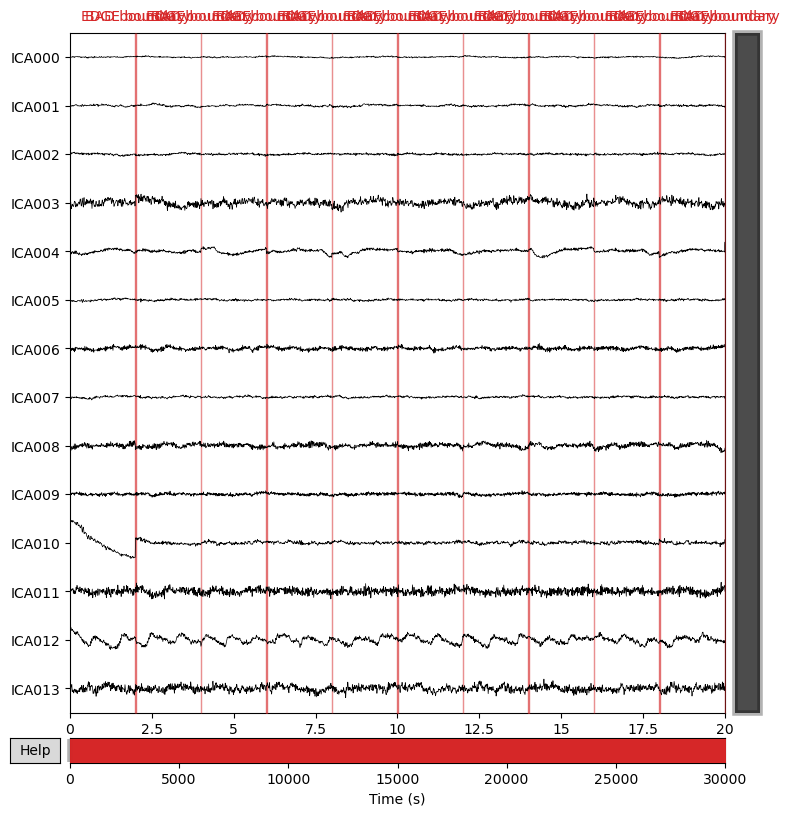

Plotting ICA components...


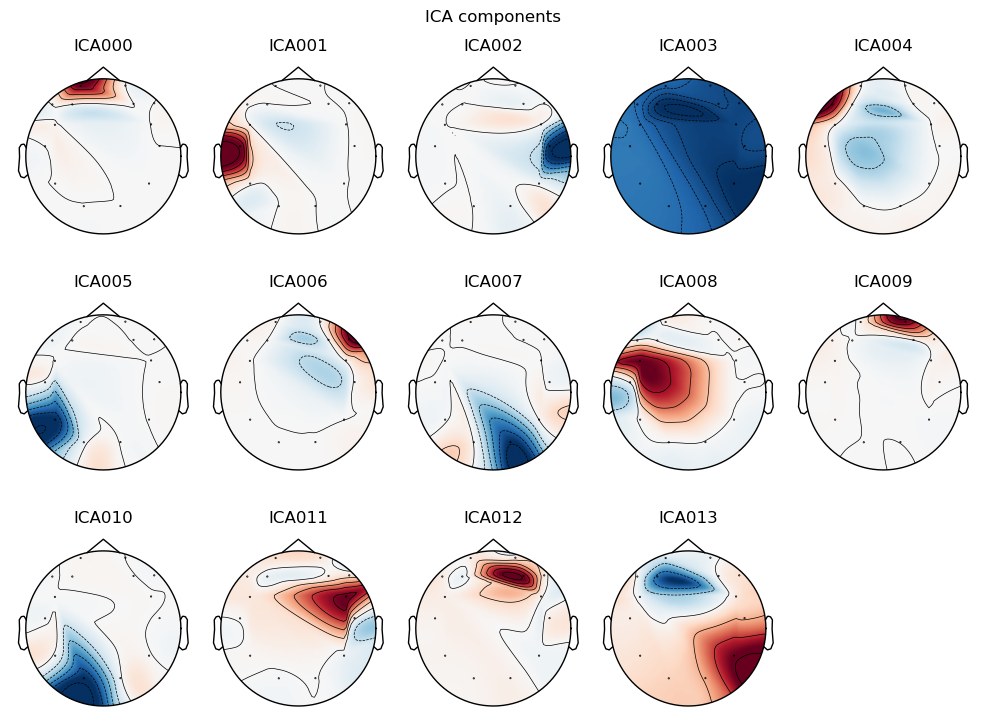

Labeling components via ICLabel...


/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided ICA instance was fitted with a 'picard' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance wi


 ICA Component Index ↔ Label:
 - ICA000: other
 - ICA001: other
 - ICA002: other
 - ICA003: other
 - ICA004: other
 - ICA005: brain
 - ICA006: other
 - ICA007: brain
 - ICA008: other
 - ICA009: other
 - ICA010: brain
 - ICA011: other
 - ICA012: other
 - ICA013: brain

 ICA Component Label Breakdown:
 - other     : 10 components
 - brain     : 4 components


In [29]:
x_data, y_data, class_counts = load_data("EP1.01.txt", max_samples_per_digit=6500)

selected_indices = np.arange(N_ICA_TRIALS)

# Convert selected trials into MNE Raw objects (unfiltered)
raw_list = [to_mne_raw(x_data[i], CHANNEL_NAMES, fs=FS) for i in selected_indices]

# Concatenate into one long continuous Raw object
raw_all = mne.concatenate_raws(raw_list)

# Set average reference
raw_all.set_eeg_reference('average', projection=True)

# === Run ICA on the raw (unfiltered) data ===
ica_obj, ic_labels, label_dict = apply_ICA(
    raw_all,
    n_components=14,
    method='picard',
    random_state=42,
    plot_picks=[0]
)

Filtering Trials: 100%|██████████| 64344/64344 [08:55<00:00, 120.08it/s]


Saved bandpass filtered EEG as filtered_eeg.npy
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0

/tmp/ipykernel_56234/3997149820.py:5: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Selecting by number: 14 components
Fitting ICA took 52.7s.
Plotting ICA sources...
Creating RawArray with float64 data, n_channels=14, n_times=3840000
    Range : 0 ... 3839999 =      0.000 ... 29999.992 secs
Ready.


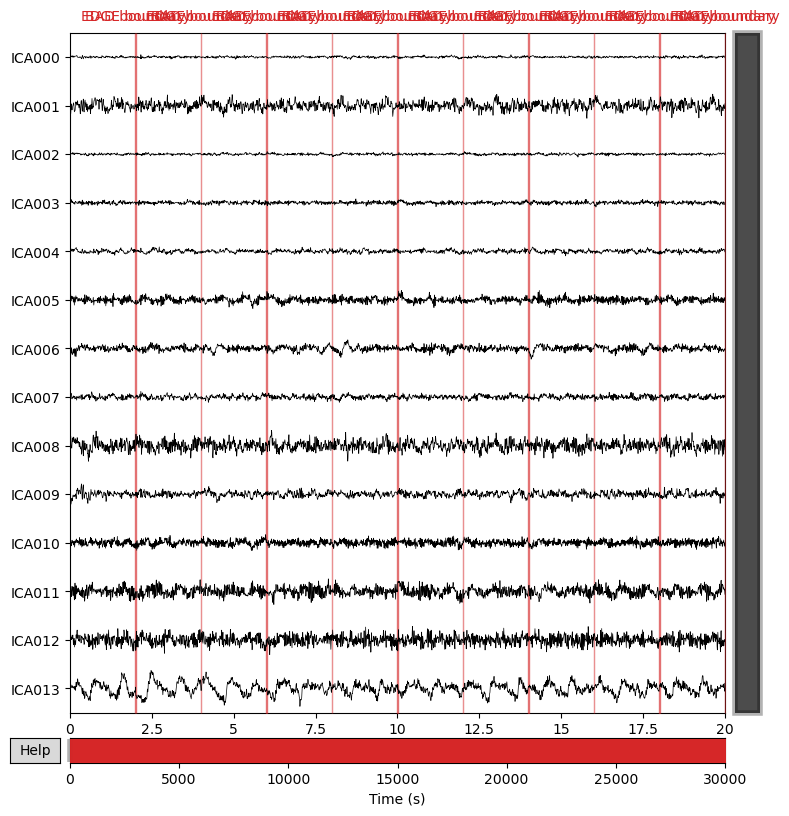

Plotting ICA components...


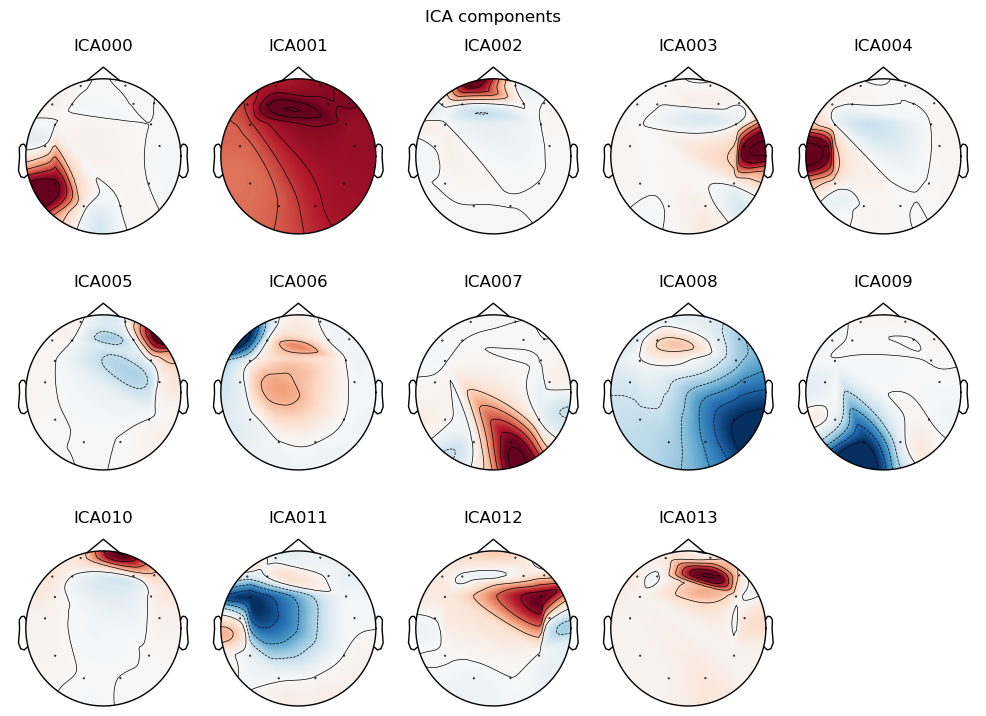

Labeling components via ICLabel...


/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided ICA instance was fitted with a 'picard' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance wi


 ICA Component Index ↔ Label:
 - ICA000: brain
 - ICA001: other
 - ICA002: eye blink
 - ICA003: other
 - ICA004: other
 - ICA005: brain
 - ICA006: brain
 - ICA007: brain
 - ICA008: brain
 - ICA009: brain
 - ICA010: eye blink
 - ICA011: other
 - ICA012: other
 - ICA013: other

 ICA Component Label Breakdown:
 - brain     : 6 components
 - other     : 6 components
 - eye blink : 2 components


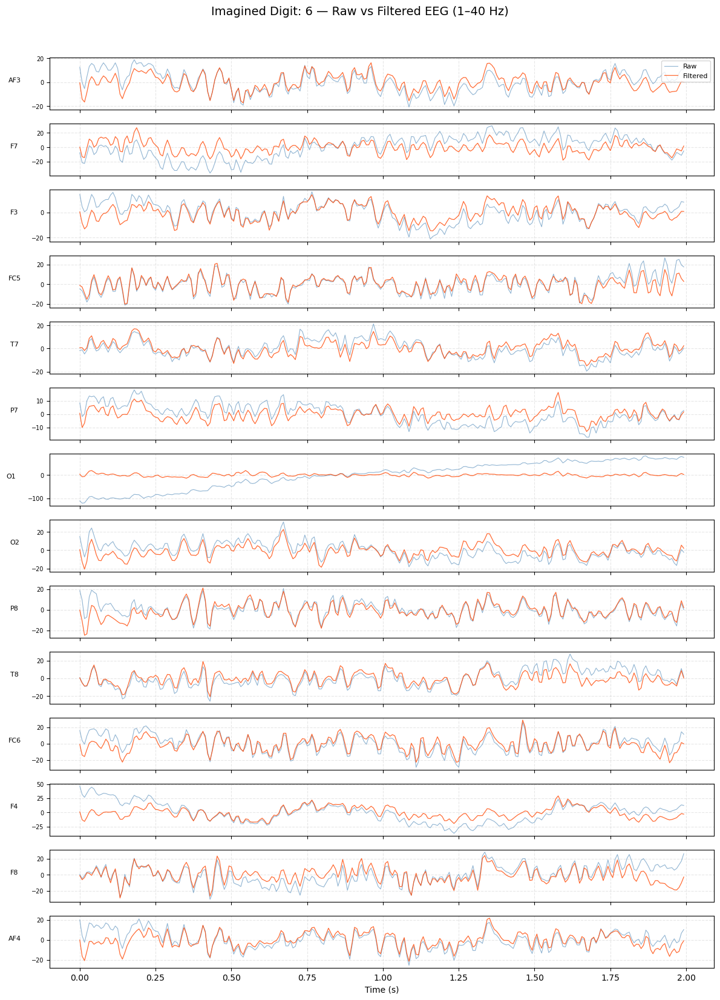

In [30]:
x_data_filtered = bandpass_all_trials(x_data, fs=128, lowcut=1, highcut=40)
np.save("raw_filtered.npy", x_data_filtered)
print("Saved bandpass filtered EEG as filtered_eeg.npy")

ica_indices = np.arange(N_ICA_TRIALS)
raw_list = [to_mne_raw(x_data_filtered[i], CHANNEL_NAMES, fs=FS) for i in ica_indices]
raw_all = mne.concatenate_raws(raw_list)

raw_all.set_eeg_reference('average', projection=True)
raw_filter = raw_all.copy() 

ica_obj, _, _ = apply_ICA(
    raw_filter,
    n_components=14,
    method='picard',
    random_state=42,
    plot_picks=[0]
)

# Remove DC offset (mean) from raw signal
x_data_detrended = x_data - np.mean(x_data, axis=-1, keepdims=True)

trial_idx = 0
# Then pick the trial for plotting
x_raw_sample = x_data_detrended[trial_idx][np.newaxis, :, :]
x_filt_sample = x_data_filtered[trial_idx][np.newaxis, :, :]

# Plot
plot_all_channels_eeg(
    x_raw=x_raw_sample,
    x_filt=x_filt_sample,
    trial_index=trial_idx,
    channel_names=CHANNEL_NAMES,
    fs=FS,
    duration_sec=2,
    y_labels=y_data
)

Found 56732 good trials for ASR calibration
ASR calibration complete
Applying ASR to all trials...


ASR Cleaning:   1%|          | 671/64344 [00:00<00:09, 6702.11it/s]

Trial 00134 changed significantly (Δ = 5.04 µV)
Trial 00135 changed significantly (Δ = 10.64 µV)
Trial 00136 changed significantly (Δ = 7.74 µV)
Trial 00137 changed significantly (Δ = 10.31 µV)
Trial 00138 changed significantly (Δ = 9.32 µV)
Trial 00139 changed significantly (Δ = 9.11 µV)
Trial 00140 changed significantly (Δ = 10.56 µV)
Trial 00141 changed significantly (Δ = 9.39 µV)
Trial 00142 changed significantly (Δ = 12.35 µV)
Trial 00143 changed significantly (Δ = 9.65 µV)
Trial 00144 changed significantly (Δ = 8.00 µV)
Trial 00145 changed significantly (Δ = 9.07 µV)
Trial 00146 changed significantly (Δ = 6.82 µV)
Trial 00147 changed significantly (Δ = 9.25 µV)
Trial 00148 changed significantly (Δ = 11.60 µV)
Trial 00240 changed significantly (Δ = 7.97 µV)
Trial 00245 changed significantly (Δ = 6.60 µV)
Trial 00250 changed significantly (Δ = 6.14 µV)
Trial 00251 changed significantly (Δ = 7.49 µV)
Trial 00252 changed significantly (Δ = 8.98 µV)
Trial 00253 changed significantly (

ASR Cleaning:   2%|▏         | 1351/64344 [00:00<00:09, 6758.80it/s]

Trial 01428 changed significantly (Δ = 5.57 µV)
Trial 01444 changed significantly (Δ = 5.13 µV)
Trial 01445 changed significantly (Δ = 8.73 µV)
Trial 01446 changed significantly (Δ = 7.49 µV)
Trial 01447 changed significantly (Δ = 8.98 µV)
Trial 01454 changed significantly (Δ = 9.62 µV)
Trial 01457 changed significantly (Δ = 5.41 µV)
Trial 01458 changed significantly (Δ = 11.38 µV)


ASR Cleaning:   4%|▍         | 2688/64344 [00:00<00:09, 6560.21it/s]

Trial 01503 changed significantly (Δ = 11.82 µV)
Trial 01504 changed significantly (Δ = 9.69 µV)
Trial 01505 changed significantly (Δ = 8.18 µV)
Trial 01506 changed significantly (Δ = 8.58 µV)
Trial 01507 changed significantly (Δ = 16.25 µV)
Trial 01508 changed significantly (Δ = 7.53 µV)
Trial 01509 changed significantly (Δ = 12.69 µV)
Trial 01510 changed significantly (Δ = 11.13 µV)
Trial 01511 changed significantly (Δ = 7.16 µV)
Trial 01512 changed significantly (Δ = 9.17 µV)
Trial 01513 changed significantly (Δ = 9.57 µV)
Trial 01514 changed significantly (Δ = 16.49 µV)
Trial 01515 changed significantly (Δ = 18.21 µV)
Trial 01516 changed significantly (Δ = 12.27 µV)
Trial 01526 changed significantly (Δ = 5.94 µV)
Trial 01527 changed significantly (Δ = 5.69 µV)
Trial 01528 changed significantly (Δ = 5.36 µV)
Trial 01529 changed significantly (Δ = 5.07 µV)
Trial 01535 changed significantly (Δ = 6.35 µV)
Trial 01537 changed significantly (Δ = 5.25 µV)
Trial 01540 changed significantly

ASR Cleaning:   6%|▌         | 4020/64344 [00:00<00:09, 6620.02it/s]

Trial 02876 changed significantly (Δ = 5.88 µV)
Trial 02877 changed significantly (Δ = 7.65 µV)
Trial 02878 changed significantly (Δ = 12.92 µV)
Trial 02879 changed significantly (Δ = 10.25 µV)
Trial 02880 changed significantly (Δ = 16.89 µV)
Trial 02881 changed significantly (Δ = 12.04 µV)
Trial 02882 changed significantly (Δ = 7.55 µV)
Trial 02883 changed significantly (Δ = 8.14 µV)
Trial 02884 changed significantly (Δ = 6.95 µV)
Trial 02885 changed significantly (Δ = 8.43 µV)
Trial 02886 changed significantly (Δ = 11.78 µV)
Trial 02887 changed significantly (Δ = 12.50 µV)
Trial 02888 changed significantly (Δ = 12.79 µV)
Trial 02889 changed significantly (Δ = 11.34 µV)
Trial 02984 changed significantly (Δ = 5.31 µV)
Trial 02989 changed significantly (Δ = 9.12 µV)
Trial 02991 changed significantly (Δ = 7.14 µV)
Trial 02992 changed significantly (Δ = 8.02 µV)
Trial 02993 changed significantly (Δ = 8.23 µV)
Trial 02995 changed significantly (Δ = 5.31 µV)
Trial 02996 changed significantl

ASR Cleaning:   8%|▊         | 5396/64344 [00:00<00:08, 6768.66it/s]

Trial 04279 changed significantly (Δ = 6.25 µV)
Trial 04284 changed significantly (Δ = 5.81 µV)
Trial 04367 changed significantly (Δ = 6.08 µV)
Trial 04399 changed significantly (Δ = 7.21 µV)
Trial 04404 changed significantly (Δ = 5.78 µV)
Trial 04405 changed significantly (Δ = 8.21 µV)
Trial 04408 changed significantly (Δ = 8.97 µV)
Trial 04409 changed significantly (Δ = 9.27 µV)
Trial 04425 changed significantly (Δ = 7.28 µV)
Trial 04426 changed significantly (Δ = 8.56 µV)
Trial 04433 changed significantly (Δ = 5.13 µV)
Trial 04434 changed significantly (Δ = 5.58 µV)
Trial 04502 changed significantly (Δ = 5.04 µV)
Trial 04506 changed significantly (Δ = 11.41 µV)
Trial 04514 changed significantly (Δ = 6.30 µV)
Trial 04515 changed significantly (Δ = 5.04 µV)
Trial 04517 changed significantly (Δ = 5.28 µV)
Trial 04527 changed significantly (Δ = 6.05 µV)
Trial 04544 changed significantly (Δ = 5.27 µV)
Trial 04550 changed significantly (Δ = 5.80 µV)
Trial 04576 changed significantly (Δ = 

ASR Cleaning:  10%|█         | 6750/64344 [00:01<00:08, 6749.05it/s]

Trial 05690 changed significantly (Δ = 5.39 µV)
Trial 05691 changed significantly (Δ = 6.09 µV)
Trial 05731 changed significantly (Δ = 6.72 µV)
Trial 05734 changed significantly (Δ = 7.28 µV)
Trial 05736 changed significantly (Δ = 5.46 µV)
Trial 05849 changed significantly (Δ = 20.68 µV)
Trial 05854 changed significantly (Δ = 18.60 µV)
Trial 05872 changed significantly (Δ = 7.11 µV)
Trial 05873 changed significantly (Δ = 9.19 µV)
Trial 05874 changed significantly (Δ = 7.96 µV)
Trial 05875 changed significantly (Δ = 5.88 µV)
Trial 05876 changed significantly (Δ = 8.19 µV)
Trial 05877 changed significantly (Δ = 6.27 µV)
Trial 05878 changed significantly (Δ = 5.46 µV)
Trial 05879 changed significantly (Δ = 7.86 µV)
Trial 05880 changed significantly (Δ = 9.12 µV)
Trial 05881 changed significantly (Δ = 5.92 µV)
Trial 05882 changed significantly (Δ = 6.53 µV)
Trial 05883 changed significantly (Δ = 7.66 µV)
Trial 05884 changed significantly (Δ = 8.63 µV)
Trial 05885 changed significantly (Δ =

ASR Cleaning:  13%|█▎        | 8125/64344 [00:01<00:08, 6798.28it/s]

Trial 07083 changed significantly (Δ = 16.84 µV)
Trial 07084 changed significantly (Δ = 24.99 µV)
Trial 07158 changed significantly (Δ = 7.50 µV)
Trial 07164 changed significantly (Δ = 9.67 µV)
Trial 07172 changed significantly (Δ = 5.02 µV)
Trial 07173 changed significantly (Δ = 6.26 µV)
Trial 07174 changed significantly (Δ = 7.92 µV)
Trial 07175 changed significantly (Δ = 7.19 µV)
Trial 07176 changed significantly (Δ = 7.97 µV)
Trial 07177 changed significantly (Δ = 8.11 µV)
Trial 07178 changed significantly (Δ = 12.13 µV)
Trial 07179 changed significantly (Δ = 8.68 µV)
Trial 07180 changed significantly (Δ = 8.29 µV)
Trial 07181 changed significantly (Δ = 8.24 µV)
Trial 07182 changed significantly (Δ = 10.33 µV)
Trial 07183 changed significantly (Δ = 7.74 µV)
Trial 07184 changed significantly (Δ = 8.30 µV)
Trial 07185 changed significantly (Δ = 9.23 µV)
Trial 07186 changed significantly (Δ = 7.82 µV)
Trial 07262 changed significantly (Δ = 11.20 µV)
Trial 07263 changed significantly (

ASR Cleaning:  15%|█▍        | 9507/64344 [00:01<00:07, 6861.63it/s]

Trial 08579 changed significantly (Δ = 5.12 µV)
Trial 08643 changed significantly (Δ = 11.31 µV)
Trial 08644 changed significantly (Δ = 12.38 µV)
Trial 08645 changed significantly (Δ = 11.29 µV)
Trial 08646 changed significantly (Δ = 7.56 µV)
Trial 08647 changed significantly (Δ = 6.88 µV)
Trial 08648 changed significantly (Δ = 6.04 µV)
Trial 08649 changed significantly (Δ = 5.09 µV)
Trial 08650 changed significantly (Δ = 5.70 µV)
Trial 08651 changed significantly (Δ = 7.95 µV)
Trial 08652 changed significantly (Δ = 9.37 µV)
Trial 08653 changed significantly (Δ = 6.81 µV)
Trial 08654 changed significantly (Δ = 7.40 µV)
Trial 08655 changed significantly (Δ = 6.58 µV)
Trial 08656 changed significantly (Δ = 6.38 µV)
Trial 08675 changed significantly (Δ = 5.31 µV)
Trial 08686 changed significantly (Δ = 7.92 µV)
Trial 08687 changed significantly (Δ = 9.51 µV)
Trial 08688 changed significantly (Δ = 5.93 µV)
Trial 08689 changed significantly (Δ = 6.46 µV)
Trial 08690 changed significantly (Δ 

ASR Cleaning:  17%|█▋        | 10882/64344 [00:01<00:07, 6813.78it/s]

Trial 10077 changed significantly (Δ = 7.01 µV)
Trial 10079 changed significantly (Δ = 9.24 µV)
Trial 10082 changed significantly (Δ = 15.89 µV)
Trial 10084 changed significantly (Δ = 7.72 µV)
Trial 10085 changed significantly (Δ = 14.04 µV)
Trial 10087 changed significantly (Δ = 7.00 µV)
Trial 10088 changed significantly (Δ = 10.14 µV)
Trial 10089 changed significantly (Δ = 12.63 µV)
Trial 10090 changed significantly (Δ = 14.13 µV)
Trial 10122 changed significantly (Δ = 8.57 µV)
Trial 10123 changed significantly (Δ = 9.35 µV)
Trial 10124 changed significantly (Δ = 5.26 µV)
Trial 10125 changed significantly (Δ = 7.04 µV)
Trial 10126 changed significantly (Δ = 6.35 µV)
Trial 10127 changed significantly (Δ = 6.99 µV)
Trial 10128 changed significantly (Δ = 9.62 µV)
Trial 10129 changed significantly (Δ = 18.46 µV)
Trial 10130 changed significantly (Δ = 5.43 µV)
Trial 10131 changed significantly (Δ = 7.89 µV)
Trial 10132 changed significantly (Δ = 5.01 µV)
Trial 10134 changed significantly 

ASR Cleaning:  19%|█▉        | 12275/64344 [00:01<00:07, 6894.99it/s]

Trial 11486 changed significantly (Δ = 6.09 µV)
Trial 11487 changed significantly (Δ = 8.51 µV)
Trial 11488 changed significantly (Δ = 12.79 µV)
Trial 11489 changed significantly (Δ = 11.26 µV)
Trial 11490 changed significantly (Δ = 15.62 µV)
Trial 11495 changed significantly (Δ = 6.18 µV)
Trial 11497 changed significantly (Δ = 7.59 µV)
Trial 11498 changed significantly (Δ = 8.00 µV)
Trial 11499 changed significantly (Δ = 5.74 µV)
Trial 11500 changed significantly (Δ = 11.30 µV)
Trial 11501 changed significantly (Δ = 9.89 µV)
Trial 11502 changed significantly (Δ = 22.19 µV)
Trial 11503 changed significantly (Δ = 35.40 µV)
Trial 11504 changed significantly (Δ = 31.39 µV)
Trial 11505 changed significantly (Δ = 34.89 µV)
Trial 11506 changed significantly (Δ = 40.20 µV)
Trial 11507 changed significantly (Δ = 6.94 µV)
Trial 11508 changed significantly (Δ = 12.92 µV)
Trial 11510 changed significantly (Δ = 5.49 µV)
Trial 11541 changed significantly (Δ = 6.48 µV)
Trial 11542 changed significan

ASR Cleaning:  21%|██        | 13651/64344 [00:02<00:07, 6800.50it/s]

Trial 12940 changed significantly (Δ = 5.59 µV)
Trial 12963 changed significantly (Δ = 9.03 µV)
Trial 12964 changed significantly (Δ = 7.28 µV)
Trial 12966 changed significantly (Δ = 5.89 µV)
Trial 12967 changed significantly (Δ = 9.06 µV)
Trial 12969 changed significantly (Δ = 5.31 µV)
Trial 12970 changed significantly (Δ = 8.23 µV)
Trial 12971 changed significantly (Δ = 8.38 µV)
Trial 12972 changed significantly (Δ = 10.29 µV)
Trial 12973 changed significantly (Δ = 22.97 µV)
Trial 12974 changed significantly (Δ = 18.81 µV)
Trial 12975 changed significantly (Δ = 11.62 µV)
Trial 12976 changed significantly (Δ = 18.23 µV)
Trial 12977 changed significantly (Δ = 16.22 µV)
Trial 12978 changed significantly (Δ = 17.60 µV)
Trial 12979 changed significantly (Δ = 13.60 µV)
Trial 12980 changed significantly (Δ = 11.52 µV)
Trial 12981 changed significantly (Δ = 11.40 µV)
Trial 12982 changed significantly (Δ = 9.24 µV)
Trial 12983 changed significantly (Δ = 9.51 µV)
Trial 12984 changed significan

ASR Cleaning:  23%|██▎       | 15010/64344 [00:02<00:07, 6725.36it/s]

Trial 14301 changed significantly (Δ = 6.47 µV)
Trial 14302 changed significantly (Δ = 6.21 µV)
Trial 14303 changed significantly (Δ = 5.87 µV)
Trial 14304 changed significantly (Δ = 6.26 µV)
Trial 14305 changed significantly (Δ = 6.11 µV)
Trial 14306 changed significantly (Δ = 7.12 µV)
Trial 14307 changed significantly (Δ = 7.52 µV)
Trial 14308 changed significantly (Δ = 7.66 µV)
Trial 14309 changed significantly (Δ = 7.83 µV)
Trial 14310 changed significantly (Δ = 6.46 µV)
Trial 14311 changed significantly (Δ = 8.16 µV)
Trial 14312 changed significantly (Δ = 8.57 µV)
Trial 14313 changed significantly (Δ = 9.15 µV)
Trial 14314 changed significantly (Δ = 8.75 µV)
Trial 14319 changed significantly (Δ = 6.84 µV)
Trial 14334 changed significantly (Δ = 5.69 µV)
Trial 14341 changed significantly (Δ = 5.01 µV)
Trial 14342 changed significantly (Δ = 8.81 µV)
Trial 14343 changed significantly (Δ = 9.39 µV)
Trial 14344 changed significantly (Δ = 5.43 µV)
Trial 14379 changed significantly (Δ = 7

ASR Cleaning:  25%|██▌       | 16376/64344 [00:02<00:07, 6759.06it/s]

Trial 15678 changed significantly (Δ = 7.01 µV)
Trial 15702 changed significantly (Δ = 5.59 µV)
Trial 15735 changed significantly (Δ = 5.73 µV)
Trial 15782 changed significantly (Δ = 5.34 µV)
Trial 15783 changed significantly (Δ = 5.20 µV)
Trial 15849 changed significantly (Δ = 5.10 µV)
Trial 15855 changed significantly (Δ = 7.71 µV)
Trial 15856 changed significantly (Δ = 6.23 µV)
Trial 15924 changed significantly (Δ = 12.96 µV)
Trial 15925 changed significantly (Δ = 12.65 µV)
Trial 15926 changed significantly (Δ = 9.01 µV)
Trial 15927 changed significantly (Δ = 10.93 µV)
Trial 15928 changed significantly (Δ = 9.87 µV)
Trial 15929 changed significantly (Δ = 8.87 µV)
Trial 15930 changed significantly (Δ = 9.91 µV)
Trial 15931 changed significantly (Δ = 8.97 µV)
Trial 15932 changed significantly (Δ = 10.74 µV)
Trial 15933 changed significantly (Δ = 13.33 µV)
Trial 15934 changed significantly (Δ = 11.75 µV)
Trial 15935 changed significantly (Δ = 13.45 µV)
Trial 15936 changed significantly

ASR Cleaning:  28%|██▊       | 17740/64344 [00:02<00:06, 6723.42it/s]

Trial 17067 changed significantly (Δ = 5.58 µV)
Trial 17068 changed significantly (Δ = 5.72 µV)
Trial 17069 changed significantly (Δ = 5.08 µV)
Trial 17098 changed significantly (Δ = 7.52 µV)
Trial 17104 changed significantly (Δ = 5.46 µV)
Trial 17106 changed significantly (Δ = 6.77 µV)
Trial 17107 changed significantly (Δ = 5.65 µV)
Trial 17111 changed significantly (Δ = 6.28 µV)
Trial 17273 changed significantly (Δ = 5.66 µV)
Trial 17283 changed significantly (Δ = 7.49 µV)
Trial 17285 changed significantly (Δ = 5.04 µV)
Trial 17292 changed significantly (Δ = 5.82 µV)
Trial 17387 changed significantly (Δ = 13.65 µV)
Trial 17388 changed significantly (Δ = 16.70 µV)
Trial 17389 changed significantly (Δ = 10.07 µV)
Trial 17390 changed significantly (Δ = 12.95 µV)
Trial 17391 changed significantly (Δ = 9.83 µV)
Trial 17392 changed significantly (Δ = 11.19 µV)
Trial 17393 changed significantly (Δ = 7.93 µV)
Trial 17394 changed significantly (Δ = 10.40 µV)
Trial 17395 changed significantly 

ASR Cleaning:  30%|██▉       | 19117/64344 [00:02<00:06, 6800.85it/s]

Trial 18634 changed significantly (Δ = 16.79 µV)
Trial 18635 changed significantly (Δ = 10.97 µV)
Trial 18636 changed significantly (Δ = 9.31 µV)
Trial 18637 changed significantly (Δ = 8.83 µV)
Trial 18638 changed significantly (Δ = 7.19 µV)
Trial 18639 changed significantly (Δ = 15.85 µV)
Trial 18640 changed significantly (Δ = 9.44 µV)
Trial 18641 changed significantly (Δ = 7.64 µV)
Trial 18642 changed significantly (Δ = 14.60 µV)
Trial 18643 changed significantly (Δ = 12.86 µV)
Trial 18644 changed significantly (Δ = 6.30 µV)
Trial 18645 changed significantly (Δ = 16.30 µV)
Trial 18646 changed significantly (Δ = 7.38 µV)
Trial 18647 changed significantly (Δ = 12.13 µV)
Trial 18702 changed significantly (Δ = 6.13 µV)
Trial 18703 changed significantly (Δ = 8.30 µV)
Trial 18704 changed significantly (Δ = 6.58 µV)
Trial 18713 changed significantly (Δ = 5.09 µV)
Trial 18714 changed significantly (Δ = 7.44 µV)
Trial 18794 changed significantly (Δ = 6.79 µV)
Trial 18806 changed significantly

ASR Cleaning:  31%|███       | 19798/64344 [00:02<00:06, 6746.94it/s]

Trial 19728 changed significantly (Δ = 5.28 µV)
Trial 19807 changed significantly (Δ = 5.13 µV)
Trial 19808 changed significantly (Δ = 6.40 µV)
Trial 19813 changed significantly (Δ = 6.75 µV)


ASR Cleaning:  32%|███▏      | 20473/64344 [00:03<00:06, 6644.58it/s]

Trial 19994 changed significantly (Δ = 5.60 µV)
Trial 19999 changed significantly (Δ = 9.55 µV)
Trial 20000 changed significantly (Δ = 9.12 µV)
Trial 20001 changed significantly (Δ = 13.84 µV)
Trial 20002 changed significantly (Δ = 7.17 µV)
Trial 20003 changed significantly (Δ = 7.21 µV)
Trial 20004 changed significantly (Δ = 8.80 µV)
Trial 20005 changed significantly (Δ = 7.82 µV)
Trial 20006 changed significantly (Δ = 8.03 µV)
Trial 20007 changed significantly (Δ = 7.50 µV)
Trial 20008 changed significantly (Δ = 8.76 µV)
Trial 20009 changed significantly (Δ = 8.50 µV)
Trial 20010 changed significantly (Δ = 7.57 µV)
Trial 20011 changed significantly (Δ = 7.47 µV)
Trial 20012 changed significantly (Δ = 6.45 µV)
Trial 20031 changed significantly (Δ = 5.23 µV)
Trial 20032 changed significantly (Δ = 8.28 µV)
Trial 20043 changed significantly (Δ = 5.27 µV)
Trial 20044 changed significantly (Δ = 7.72 µV)
Trial 20045 changed significantly (Δ = 6.20 µV)
Trial 20049 changed significantly (Δ = 

ASR Cleaning:  33%|███▎      | 21138/64344 [00:03<00:06, 6646.04it/s]

Trial 21086 changed significantly (Δ = 5.27 µV)
Trial 21184 changed significantly (Δ = 5.11 µV)
Trial 21185 changed significantly (Δ = 8.38 µV)
Trial 21186 changed significantly (Δ = 8.67 µV)
Trial 21187 changed significantly (Δ = 12.41 µV)
Trial 21189 changed significantly (Δ = 6.65 µV)
Trial 21191 changed significantly (Δ = 6.76 µV)
Trial 21197 changed significantly (Δ = 10.93 µV)
Trial 21199 changed significantly (Δ = 5.70 µV)
Trial 21200 changed significantly (Δ = 7.98 µV)


ASR Cleaning:  34%|███▍      | 21813/64344 [00:03<00:06, 6675.26it/s]

Trial 21343 changed significantly (Δ = 9.06 µV)
Trial 21344 changed significantly (Δ = 8.35 µV)
Trial 21377 changed significantly (Δ = 9.64 µV)
Trial 21459 changed significantly (Δ = 7.28 µV)
Trial 21460 changed significantly (Δ = 6.37 µV)
Trial 21461 changed significantly (Δ = 6.79 µV)
Trial 21462 changed significantly (Δ = 5.20 µV)
Trial 21464 changed significantly (Δ = 7.94 µV)
Trial 21465 changed significantly (Δ = 17.29 µV)
Trial 21468 changed significantly (Δ = 5.94 µV)
Trial 21516 changed significantly (Δ = 5.18 µV)
Trial 21550 changed significantly (Δ = 20.96 µV)
Trial 21551 changed significantly (Δ = 11.21 µV)
Trial 21560 changed significantly (Δ = 15.72 µV)
Trial 21655 changed significantly (Δ = 8.54 µV)
Trial 21660 changed significantly (Δ = 9.98 µV)
Trial 21661 changed significantly (Δ = 10.93 µV)
Trial 21662 changed significantly (Δ = 6.66 µV)
Trial 21780 changed significantly (Δ = 8.49 µV)
Trial 21782 changed significantly (Δ = 5.34 µV)
Trial 21880 changed significantly (

ASR Cleaning:  35%|███▍      | 22494/64344 [00:03<00:06, 6713.34it/s]

Trial 22457 changed significantly (Δ = 5.22 µV)
Trial 22460 changed significantly (Δ = 8.41 µV)
Trial 22465 changed significantly (Δ = 5.70 µV)
Trial 22466 changed significantly (Δ = 10.03 µV)
Trial 22467 changed significantly (Δ = 7.41 µV)
Trial 22474 changed significantly (Δ = 5.89 µV)
Trial 22481 changed significantly (Δ = 8.77 µV)
Trial 22633 changed significantly (Δ = 8.58 µV)
Trial 22634 changed significantly (Δ = 6.97 µV)
Trial 22635 changed significantly (Δ = 8.05 µV)
Trial 22636 changed significantly (Δ = 7.20 µV)
Trial 22637 changed significantly (Δ = 8.49 µV)
Trial 22638 changed significantly (Δ = 7.99 µV)
Trial 22639 changed significantly (Δ = 7.02 µV)
Trial 22640 changed significantly (Δ = 8.97 µV)
Trial 22641 changed significantly (Δ = 6.45 µV)
Trial 22642 changed significantly (Δ = 8.41 µV)
Trial 22643 changed significantly (Δ = 7.04 µV)
Trial 22644 changed significantly (Δ = 6.16 µV)
Trial 22645 changed significantly (Δ = 8.29 µV)
Trial 22646 changed significantly (Δ = 

ASR Cleaning:  36%|███▌      | 23179/64344 [00:03<00:06, 6751.81it/s]

Trial 22781 changed significantly (Δ = 6.72 µV)
Trial 22782 changed significantly (Δ = 8.91 µV)
Trial 22785 changed significantly (Δ = 10.72 µV)
Trial 22786 changed significantly (Δ = 7.23 µV)
Trial 22790 changed significantly (Δ = 7.68 µV)
Trial 22792 changed significantly (Δ = 6.90 µV)
Trial 22793 changed significantly (Δ = 6.54 µV)
Trial 22796 changed significantly (Δ = 7.83 µV)
Trial 22797 changed significantly (Δ = 8.62 µV)
Trial 22798 changed significantly (Δ = 10.81 µV)
Trial 22799 changed significantly (Δ = 9.61 µV)
Trial 22800 changed significantly (Δ = 7.14 µV)
Trial 22801 changed significantly (Δ = 6.37 µV)
Trial 22802 changed significantly (Δ = 10.61 µV)
Trial 22803 changed significantly (Δ = 7.14 µV)
Trial 22804 changed significantly (Δ = 9.91 µV)
Trial 22805 changed significantly (Δ = 8.86 µV)
Trial 22806 changed significantly (Δ = 8.26 µV)
Trial 22807 changed significantly (Δ = 9.86 µV)
Trial 22808 changed significantly (Δ = 7.45 µV)
Trial 22809 changed significantly (Δ 

ASR Cleaning:  37%|███▋      | 23892/64344 [00:03<00:05, 6864.22it/s]

Trial 23921 changed significantly (Δ = 5.10 µV)
Trial 24063 changed significantly (Δ = 8.76 µV)
Trial 24064 changed significantly (Δ = 5.58 µV)
Trial 24071 changed significantly (Δ = 6.43 µV)
Trial 24072 changed significantly (Δ = 6.64 µV)
Trial 24073 changed significantly (Δ = 6.62 µV)
Trial 24074 changed significantly (Δ = 6.23 µV)
Trial 24077 changed significantly (Δ = 6.61 µV)
Trial 24078 changed significantly (Δ = 8.51 µV)
Trial 24079 changed significantly (Δ = 8.96 µV)
Trial 24080 changed significantly (Δ = 9.95 µV)
Trial 24081 changed significantly (Δ = 6.08 µV)
Trial 24082 changed significantly (Δ = 7.85 µV)
Trial 24083 changed significantly (Δ = 7.42 µV)
Trial 24084 changed significantly (Δ = 5.55 µV)
Trial 24085 changed significantly (Δ = 7.03 µV)
Trial 24086 changed significantly (Δ = 8.51 µV)
Trial 24087 changed significantly (Δ = 6.51 µV)
Trial 24088 changed significantly (Δ = 6.68 µV)
Trial 24089 changed significantly (Δ = 7.77 µV)
Trial 24090 changed significantly (Δ = 5

ASR Cleaning:  39%|███▉      | 25261/64344 [00:03<00:05, 6798.11it/s]

Trial 24178 changed significantly (Δ = 8.53 µV)
Trial 24179 changed significantly (Δ = 8.42 µV)
Trial 24213 changed significantly (Δ = 6.00 µV)
Trial 24361 changed significantly (Δ = 6.19 µV)
Trial 24362 changed significantly (Δ = 7.43 µV)
Trial 24366 changed significantly (Δ = 29.05 µV)
Trial 24367 changed significantly (Δ = 20.81 µV)
Trial 24433 changed significantly (Δ = 7.38 µV)
Trial 24476 changed significantly (Δ = 13.17 µV)
Trial 24507 changed significantly (Δ = 11.18 µV)
Trial 24508 changed significantly (Δ = 41.89 µV)
Trial 24509 changed significantly (Δ = 39.47 µV)
Trial 24510 changed significantly (Δ = 30.36 µV)
Trial 24512 changed significantly (Δ = 37.00 µV)
Trial 24513 changed significantly (Δ = 23.16 µV)
Trial 24514 changed significantly (Δ = 48.15 µV)
Trial 24515 changed significantly (Δ = 13.60 µV)
Trial 24553 changed significantly (Δ = 7.38 µV)
Trial 24554 changed significantly (Δ = 6.96 µV)
Trial 24555 changed significantly (Δ = 5.80 µV)
Trial 24557 changed significa

ASR Cleaning:  41%|████▏     | 26660/64344 [00:03<00:05, 6901.36it/s]

Trial 25593 changed significantly (Δ = 6.28 µV)
Trial 25600 changed significantly (Δ = 19.35 µV)
Trial 25601 changed significantly (Δ = 6.34 µV)
Trial 25604 changed significantly (Δ = 6.73 µV)
Trial 25605 changed significantly (Δ = 8.57 µV)
Trial 25838 changed significantly (Δ = 5.13 µV)
Trial 25892 changed significantly (Δ = 6.41 µV)
Trial 25893 changed significantly (Δ = 8.96 µV)
Trial 25894 changed significantly (Δ = 8.95 µV)
Trial 25898 changed significantly (Δ = 6.60 µV)
Trial 25899 changed significantly (Δ = 9.55 µV)
Trial 25900 changed significantly (Δ = 8.39 µV)
Trial 25902 changed significantly (Δ = 5.38 µV)
Trial 25903 changed significantly (Δ = 6.92 µV)
Trial 26069 changed significantly (Δ = 6.74 µV)
Trial 26070 changed significantly (Δ = 5.50 µV)
Trial 26071 changed significantly (Δ = 5.21 µV)
Trial 26072 changed significantly (Δ = 5.38 µV)
Trial 26073 changed significantly (Δ = 5.28 µV)
Trial 26074 changed significantly (Δ = 5.01 µV)
Trial 26075 changed significantly (Δ = 

ASR Cleaning:  44%|████▎     | 28036/64344 [00:04<00:05, 6827.01it/s]

Trial 26987 changed significantly (Δ = 11.60 µV)
Trial 26988 changed significantly (Δ = 21.76 µV)
Trial 26989 changed significantly (Δ = 19.94 µV)
Trial 26990 changed significantly (Δ = 17.61 µV)
Trial 27145 changed significantly (Δ = 9.50 µV)
Trial 27193 changed significantly (Δ = 7.10 µV)
Trial 27198 changed significantly (Δ = 6.42 µV)
Trial 27216 changed significantly (Δ = 9.32 µV)
Trial 27236 changed significantly (Δ = 6.53 µV)
Trial 27367 changed significantly (Δ = 5.06 µV)
Trial 27381 changed significantly (Δ = 6.11 µV)
Trial 27382 changed significantly (Δ = 11.82 µV)
Trial 27383 changed significantly (Δ = 9.95 µV)
Trial 27384 changed significantly (Δ = 9.80 µV)
Trial 27385 changed significantly (Δ = 10.84 µV)
Trial 27386 changed significantly (Δ = 6.94 µV)
Trial 27387 changed significantly (Δ = 8.76 µV)
Trial 27388 changed significantly (Δ = 6.67 µV)
Trial 27389 changed significantly (Δ = 8.19 µV)
Trial 27390 changed significantly (Δ = 9.70 µV)
Trial 27391 changed significantly 

ASR Cleaning:  46%|████▌     | 29418/64344 [00:04<00:05, 6871.21it/s]

Trial 28414 changed significantly (Δ = 7.07 µV)
Trial 28415 changed significantly (Δ = 11.72 µV)
Trial 28416 changed significantly (Δ = 13.95 µV)
Trial 28417 changed significantly (Δ = 20.18 µV)
Trial 28418 changed significantly (Δ = 9.34 µV)
Trial 28419 changed significantly (Δ = 10.77 µV)
Trial 28420 changed significantly (Δ = 19.68 µV)
Trial 28421 changed significantly (Δ = 16.77 µV)
Trial 28422 changed significantly (Δ = 8.80 µV)
Trial 28425 changed significantly (Δ = 12.30 µV)
Trial 28426 changed significantly (Δ = 10.05 µV)
Trial 28427 changed significantly (Δ = 10.68 µV)
Trial 28428 changed significantly (Δ = 9.19 µV)
Trial 28429 changed significantly (Δ = 7.71 µV)
Trial 28430 changed significantly (Δ = 10.06 µV)
Trial 28431 changed significantly (Δ = 9.53 µV)
Trial 28432 changed significantly (Δ = 9.21 µV)
Trial 28433 changed significantly (Δ = 10.98 µV)
Trial 28434 changed significantly (Δ = 9.81 µV)
Trial 28435 changed significantly (Δ = 8.01 µV)
Trial 28436 changed significa

ASR Cleaning:  48%|████▊     | 30791/64344 [00:04<00:04, 6816.74it/s]

Trial 29821 changed significantly (Δ = 6.97 µV)
Trial 29824 changed significantly (Δ = 5.68 µV)
Trial 29825 changed significantly (Δ = 8.72 µV)
Trial 29826 changed significantly (Δ = 6.62 µV)
Trial 29827 changed significantly (Δ = 6.98 µV)
Trial 29828 changed significantly (Δ = 5.85 µV)
Trial 29832 changed significantly (Δ = 6.58 µV)
Trial 29835 changed significantly (Δ = 16.46 µV)
Trial 29836 changed significantly (Δ = 6.33 µV)
Trial 29837 changed significantly (Δ = 6.94 µV)
Trial 29838 changed significantly (Δ = 29.97 µV)
Trial 29839 changed significantly (Δ = 9.04 µV)
Trial 29840 changed significantly (Δ = 25.98 µV)
Trial 29841 changed significantly (Δ = 13.36 µV)
Trial 29842 changed significantly (Δ = 12.72 µV)
Trial 29843 changed significantly (Δ = 12.88 µV)
Trial 29844 changed significantly (Δ = 21.37 µV)
Trial 29845 changed significantly (Δ = 34.94 µV)
Trial 29846 changed significantly (Δ = 20.49 µV)
Trial 29847 changed significantly (Δ = 24.07 µV)
Trial 29848 changed significan

ASR Cleaning:  50%|█████     | 32178/64344 [00:04<00:04, 6769.99it/s]

Trial 31150 changed significantly (Δ = 5.69 µV)
Trial 31151 changed significantly (Δ = 6.02 µV)
Trial 31154 changed significantly (Δ = 10.03 µV)
Trial 31157 changed significantly (Δ = 6.15 µV)
Trial 31163 changed significantly (Δ = 5.31 µV)
Trial 31165 changed significantly (Δ = 8.73 µV)
Trial 31166 changed significantly (Δ = 5.45 µV)
Trial 31167 changed significantly (Δ = 8.75 µV)
Trial 31168 changed significantly (Δ = 6.95 µV)
Trial 31169 changed significantly (Δ = 8.65 µV)
Trial 31170 changed significantly (Δ = 8.14 µV)
Trial 31171 changed significantly (Δ = 11.96 µV)
Trial 31172 changed significantly (Δ = 8.27 µV)
Trial 31173 changed significantly (Δ = 13.22 µV)
Trial 31174 changed significantly (Δ = 11.48 µV)
Trial 31175 changed significantly (Δ = 11.41 µV)
Trial 31176 changed significantly (Δ = 9.73 µV)
Trial 31177 changed significantly (Δ = 13.07 µV)
Trial 31178 changed significantly (Δ = 7.76 µV)
Trial 31179 changed significantly (Δ = 6.48 µV)
Trial 31180 changed significantly 

ASR Cleaning:  52%|█████▏    | 33566/64344 [00:04<00:04, 6863.26it/s]

Trial 32556 changed significantly (Δ = 5.69 µV)
Trial 32560 changed significantly (Δ = 5.96 µV)
Trial 32561 changed significantly (Δ = 5.88 µV)
Trial 32606 changed significantly (Δ = 5.84 µV)
Trial 32607 changed significantly (Δ = 6.66 µV)
Trial 32613 changed significantly (Δ = 6.81 µV)
Trial 32614 changed significantly (Δ = 6.70 µV)
Trial 32796 changed significantly (Δ = 6.32 µV)
Trial 33022 changed significantly (Δ = 8.85 µV)
Trial 33032 changed significantly (Δ = 5.98 µV)
Trial 33034 changed significantly (Δ = 6.11 µV)
Trial 33035 changed significantly (Δ = 5.79 µV)
Trial 33038 changed significantly (Δ = 5.60 µV)
Trial 33040 changed significantly (Δ = 6.08 µV)
Trial 33042 changed significantly (Δ = 6.39 µV)
Trial 33083 changed significantly (Δ = 5.55 µV)
Trial 33086 changed significantly (Δ = 6.04 µV)
Trial 33091 changed significantly (Δ = 5.26 µV)
Trial 33126 changed significantly (Δ = 5.81 µV)
Trial 33127 changed significantly (Δ = 5.32 µV)
Trial 33272 changed significantly (Δ = 8

ASR Cleaning:  54%|█████▍    | 34940/64344 [00:05<00:04, 6855.96it/s]

Trial 34135 changed significantly (Δ = 5.09 µV)
Trial 34136 changed significantly (Δ = 5.02 µV)
Trial 34137 changed significantly (Δ = 7.05 µV)
Trial 34138 changed significantly (Δ = 5.31 µV)
Trial 34139 changed significantly (Δ = 5.98 µV)
Trial 34142 changed significantly (Δ = 5.16 µV)
Trial 34147 changed significantly (Δ = 5.57 µV)
Trial 34168 changed significantly (Δ = 5.21 µV)
Trial 34249 changed significantly (Δ = 5.37 µV)
Trial 34253 changed significantly (Δ = 7.64 µV)
Trial 34256 changed significantly (Δ = 6.38 µV)
Trial 34257 changed significantly (Δ = 7.22 µV)
Trial 34258 changed significantly (Δ = 9.40 µV)
Trial 34259 changed significantly (Δ = 7.21 µV)
Trial 34260 changed significantly (Δ = 16.91 µV)
Trial 34261 changed significantly (Δ = 8.30 µV)
Trial 34262 changed significantly (Δ = 7.33 µV)
Trial 34263 changed significantly (Δ = 8.86 µV)
Trial 34264 changed significantly (Δ = 8.00 µV)
Trial 34265 changed significantly (Δ = 8.18 µV)
Trial 34266 changed significantly (Δ = 

ASR Cleaning:  56%|█████▋    | 36317/64344 [00:05<00:04, 6861.18it/s]

Trial 35536 changed significantly (Δ = 5.77 µV)
Trial 35541 changed significantly (Δ = 8.50 µV)
Trial 35542 changed significantly (Δ = 17.70 µV)
Trial 35543 changed significantly (Δ = 16.67 µV)
Trial 35544 changed significantly (Δ = 13.81 µV)
Trial 35545 changed significantly (Δ = 12.81 µV)
Trial 35546 changed significantly (Δ = 9.71 µV)
Trial 35547 changed significantly (Δ = 7.30 µV)
Trial 35597 changed significantly (Δ = 5.72 µV)
Trial 35609 changed significantly (Δ = 6.44 µV)
Trial 35610 changed significantly (Δ = 5.56 µV)
Trial 35611 changed significantly (Δ = 11.20 µV)
Trial 35612 changed significantly (Δ = 16.89 µV)
Trial 35614 changed significantly (Δ = 6.67 µV)
Trial 35615 changed significantly (Δ = 17.60 µV)
Trial 35616 changed significantly (Δ = 10.50 µV)
Trial 35617 changed significantly (Δ = 18.17 µV)
Trial 35618 changed significantly (Δ = 8.54 µV)
Trial 35620 changed significantly (Δ = 19.32 µV)
Trial 35621 changed significantly (Δ = 10.91 µV)
Trial 35622 changed significa

ASR Cleaning:  59%|█████▊    | 37726/64344 [00:05<00:03, 6957.37it/s]

Trial 36931 changed significantly (Δ = 5.56 µV)
Trial 36987 changed significantly (Δ = 5.45 µV)
Trial 37090 changed significantly (Δ = 6.44 µV)
Trial 37091 changed significantly (Δ = 73.42 µV)
Trial 37092 changed significantly (Δ = 14.62 µV)
Trial 37093 changed significantly (Δ = 16.61 µV)
Trial 37094 changed significantly (Δ = 19.74 µV)
Trial 37095 changed significantly (Δ = 12.85 µV)
Trial 37096 changed significantly (Δ = 16.76 µV)
Trial 37097 changed significantly (Δ = 9.94 µV)
Trial 37098 changed significantly (Δ = 11.58 µV)
Trial 37099 changed significantly (Δ = 7.36 µV)
Trial 37100 changed significantly (Δ = 10.34 µV)
Trial 37101 changed significantly (Δ = 7.30 µV)
Trial 37102 changed significantly (Δ = 8.65 µV)
Trial 37103 changed significantly (Δ = 7.21 µV)
Trial 37104 changed significantly (Δ = 9.38 µV)
Trial 37105 changed significantly (Δ = 6.02 µV)
Trial 37167 changed significantly (Δ = 6.00 µV)
Trial 37182 changed significantly (Δ = 9.97 µV)
Trial 37287 changed significantl

ASR Cleaning:  61%|██████    | 39115/64344 [00:05<00:03, 6911.17it/s]

Trial 38362 changed significantly (Δ = 7.34 µV)
Trial 38469 changed significantly (Δ = 8.07 µV)
Trial 38596 changed significantly (Δ = 9.58 µV)
Trial 38601 changed significantly (Δ = 5.30 µV)
Trial 38621 changed significantly (Δ = 5.30 µV)
Trial 38662 changed significantly (Δ = 5.99 µV)
Trial 38663 changed significantly (Δ = 5.31 µV)
Trial 38681 changed significantly (Δ = 5.13 µV)
Trial 38714 changed significantly (Δ = 9.17 µV)
Trial 38716 changed significantly (Δ = 7.41 µV)
Trial 38717 changed significantly (Δ = 7.32 µV)
Trial 38718 changed significantly (Δ = 5.49 µV)
Trial 38719 changed significantly (Δ = 9.45 µV)
Trial 38720 changed significantly (Δ = 7.32 µV)
Trial 38721 changed significantly (Δ = 7.22 µV)
Trial 38722 changed significantly (Δ = 6.59 µV)
Trial 38771 changed significantly (Δ = 5.78 µV)
Trial 38774 changed significantly (Δ = 6.46 µV)
Trial 38775 changed significantly (Δ = 6.48 µV)
Trial 38776 changed significantly (Δ = 6.26 µV)
Trial 38777 changed significantly (Δ = 8

ASR Cleaning:  63%|██████▎   | 40515/64344 [00:05<00:03, 6961.05it/s]

Trial 39758 changed significantly (Δ = 7.44 µV)
Trial 39879 changed significantly (Δ = 5.40 µV)
Trial 39884 changed significantly (Δ = 5.51 µV)
Trial 39887 changed significantly (Δ = 5.44 µV)
Trial 39890 changed significantly (Δ = 5.67 µV)
Trial 39892 changed significantly (Δ = 5.19 µV)
Trial 40059 changed significantly (Δ = 7.24 µV)
Trial 40060 changed significantly (Δ = 6.70 µV)
Trial 40061 changed significantly (Δ = 8.46 µV)
Trial 40064 changed significantly (Δ = 6.81 µV)
Trial 40067 changed significantly (Δ = 7.90 µV)
Trial 40068 changed significantly (Δ = 7.73 µV)
Trial 40069 changed significantly (Δ = 8.05 µV)
Trial 40070 changed significantly (Δ = 8.24 µV)
Trial 40074 changed significantly (Δ = 5.71 µV)
Trial 40085 changed significantly (Δ = 7.47 µV)
Trial 40096 changed significantly (Δ = 5.22 µV)
Trial 40097 changed significantly (Δ = 6.08 µV)
Trial 40225 changed significantly (Δ = 10.25 µV)
Trial 40226 changed significantly (Δ = 6.08 µV)
Trial 40228 changed significantly (Δ = 

ASR Cleaning:  65%|██████▌   | 41901/64344 [00:06<00:03, 6852.69it/s]

Trial 41165 changed significantly (Δ = 5.05 µV)
Trial 41166 changed significantly (Δ = 5.50 µV)
Trial 41167 changed significantly (Δ = 5.38 µV)
Trial 41170 changed significantly (Δ = 5.78 µV)
Trial 41171 changed significantly (Δ = 5.43 µV)
Trial 41181 changed significantly (Δ = 5.39 µV)
Trial 41185 changed significantly (Δ = 6.60 µV)
Trial 41186 changed significantly (Δ = 6.00 µV)
Trial 41187 changed significantly (Δ = 6.33 µV)
Trial 41188 changed significantly (Δ = 5.74 µV)
Trial 41189 changed significantly (Δ = 7.62 µV)
Trial 41190 changed significantly (Δ = 8.17 µV)
Trial 41191 changed significantly (Δ = 5.38 µV)
Trial 41363 changed significantly (Δ = 5.19 µV)
Trial 41364 changed significantly (Δ = 5.10 µV)
Trial 41369 changed significantly (Δ = 5.42 µV)
Trial 41371 changed significantly (Δ = 7.06 µV)
Trial 41420 changed significantly (Δ = 5.90 µV)
Trial 41425 changed significantly (Δ = 6.96 µV)
Trial 41426 changed significantly (Δ = 5.44 µV)
Trial 41437 changed significantly (Δ = 5

ASR Cleaning:  67%|██████▋   | 43291/64344 [00:06<00:03, 6849.39it/s]

Trial 42541 changed significantly (Δ = 8.41 µV)
Trial 42542 changed significantly (Δ = 7.20 µV)
Trial 42552 changed significantly (Δ = 8.17 µV)
Trial 42560 changed significantly (Δ = 5.46 µV)
Trial 42612 changed significantly (Δ = 5.54 µV)
Trial 42653 changed significantly (Δ = 10.89 µV)
Trial 42654 changed significantly (Δ = 18.44 µV)
Trial 42657 changed significantly (Δ = 8.10 µV)
Trial 42661 changed significantly (Δ = 14.15 µV)
Trial 42682 changed significantly (Δ = 8.22 µV)
Trial 42683 changed significantly (Δ = 8.00 µV)
Trial 42686 changed significantly (Δ = 8.56 µV)
Trial 42687 changed significantly (Δ = 7.96 µV)
Trial 42710 changed significantly (Δ = 7.64 µV)
Trial 42875 changed significantly (Δ = 5.31 µV)
Trial 42876 changed significantly (Δ = 5.05 µV)
Trial 42877 changed significantly (Δ = 6.10 µV)
Trial 42880 changed significantly (Δ = 5.31 µV)
Trial 42881 changed significantly (Δ = 5.27 µV)
Trial 42882 changed significantly (Δ = 5.54 µV)
Trial 42883 changed significantly (Δ 

ASR Cleaning:  69%|██████▉   | 44656/64344 [00:06<00:02, 6784.92it/s]

Trial 43937 changed significantly (Δ = 5.25 µV)
Trial 43948 changed significantly (Δ = 5.55 µV)
Trial 43987 changed significantly (Δ = 6.34 µV)
Trial 43988 changed significantly (Δ = 5.93 µV)
Trial 44063 changed significantly (Δ = 5.25 µV)
Trial 44085 changed significantly (Δ = 7.07 µV)
Trial 44086 changed significantly (Δ = 5.07 µV)
Trial 44087 changed significantly (Δ = 5.89 µV)
Trial 44089 changed significantly (Δ = 5.18 µV)
Trial 44092 changed significantly (Δ = 6.67 µV)
Trial 44093 changed significantly (Δ = 5.82 µV)
Trial 44094 changed significantly (Δ = 6.54 µV)
Trial 44098 changed significantly (Δ = 5.45 µV)
Trial 44100 changed significantly (Δ = 6.46 µV)
Trial 44101 changed significantly (Δ = 10.21 µV)
Trial 44102 changed significantly (Δ = 8.62 µV)
Trial 44103 changed significantly (Δ = 9.96 µV)
Trial 44104 changed significantly (Δ = 8.27 µV)
Trial 44105 changed significantly (Δ = 8.08 µV)
Trial 44106 changed significantly (Δ = 8.40 µV)
Trial 44107 changed significantly (Δ = 

ASR Cleaning:  72%|███████▏  | 46081/64344 [00:06<00:02, 6930.79it/s]

Trial 45410 changed significantly (Δ = 5.83 µV)
Trial 45411 changed significantly (Δ = 8.61 µV)
Trial 45412 changed significantly (Δ = 6.34 µV)
Trial 45413 changed significantly (Δ = 7.29 µV)
Trial 45434 changed significantly (Δ = 6.32 µV)
Trial 45489 changed significantly (Δ = 11.79 µV)
Trial 45493 changed significantly (Δ = 5.78 µV)
Trial 45517 changed significantly (Δ = 6.80 µV)
Trial 45518 changed significantly (Δ = 6.38 µV)
Trial 45571 changed significantly (Δ = 5.04 µV)
Trial 45589 changed significantly (Δ = 10.69 µV)
Trial 45590 changed significantly (Δ = 9.15 µV)
Trial 45591 changed significantly (Δ = 6.93 µV)
Trial 45594 changed significantly (Δ = 10.20 µV)
Trial 45595 changed significantly (Δ = 9.15 µV)
Trial 45596 changed significantly (Δ = 9.19 µV)
Trial 45597 changed significantly (Δ = 7.09 µV)
Trial 45598 changed significantly (Δ = 8.77 µV)
Trial 45599 changed significantly (Δ = 7.83 µV)
Trial 45600 changed significantly (Δ = 7.37 µV)
Trial 45601 changed significantly (Δ 

ASR Cleaning:  73%|███████▎  | 46803/64344 [00:06<00:02, 7016.26it/s]

Trial 46384 changed significantly (Δ = 32.14 µV)
Trial 46385 changed significantly (Δ = 31.69 µV)
Trial 46386 changed significantly (Δ = 31.31 µV)
Trial 46387 changed significantly (Δ = 29.60 µV)
Trial 46388 changed significantly (Δ = 43.26 µV)
Trial 46389 changed significantly (Δ = 25.80 µV)
Trial 46390 changed significantly (Δ = 20.80 µV)
Trial 46391 changed significantly (Δ = 15.88 µV)
Trial 46392 changed significantly (Δ = 15.49 µV)
Trial 46393 changed significantly (Δ = 33.87 µV)
Trial 46740 changed significantly (Δ = 6.66 µV)
Trial 46749 changed significantly (Δ = 9.87 µV)
Trial 46750 changed significantly (Δ = 5.77 µV)
Trial 46751 changed significantly (Δ = 8.54 µV)
Trial 46760 changed significantly (Δ = 5.35 µV)
Trial 46765 changed significantly (Δ = 6.68 µV)
Trial 46864 changed significantly (Δ = 5.16 µV)
Trial 46870 changed significantly (Δ = 6.03 µV)


ASR Cleaning:  74%|███████▍  | 47506/64344 [00:06<00:02, 6924.06it/s]

Trial 46891 changed significantly (Δ = 5.10 µV)
Trial 46893 changed significantly (Δ = 5.57 µV)
Trial 46896 changed significantly (Δ = 5.42 µV)
Trial 46900 changed significantly (Δ = 6.50 µV)
Trial 46901 changed significantly (Δ = 6.67 µV)
Trial 46915 changed significantly (Δ = 5.27 µV)
Trial 46919 changed significantly (Δ = 7.59 µV)
Trial 46920 changed significantly (Δ = 9.18 µV)
Trial 46923 changed significantly (Δ = 15.69 µV)
Trial 46924 changed significantly (Δ = 7.70 µV)
Trial 46927 changed significantly (Δ = 12.71 µV)
Trial 46928 changed significantly (Δ = 8.43 µV)
Trial 46929 changed significantly (Δ = 6.95 µV)
Trial 46930 changed significantly (Δ = 6.43 µV)
Trial 46931 changed significantly (Δ = 9.51 µV)
Trial 47047 changed significantly (Δ = 5.48 µV)
Trial 47069 changed significantly (Δ = 7.15 µV)
Trial 47086 changed significantly (Δ = 8.11 µV)
Trial 47087 changed significantly (Δ = 5.90 µV)
Trial 47089 changed significantly (Δ = 5.09 µV)
Trial 47091 changed significantly (Δ =

ASR Cleaning:  75%|███████▍  | 48243/64344 [00:07<00:02, 7052.59it/s]

Trial 47962 changed significantly (Δ = 6.40 µV)
Trial 47965 changed significantly (Δ = 5.61 µV)
Trial 47966 changed significantly (Δ = 5.41 µV)
Trial 47968 changed significantly (Δ = 5.40 µV)
Trial 47972 changed significantly (Δ = 6.94 µV)
Trial 48106 changed significantly (Δ = 6.65 µV)
Trial 48155 changed significantly (Δ = 5.15 µV)
Trial 48156 changed significantly (Δ = 15.53 µV)
Trial 48157 changed significantly (Δ = 18.25 µV)
Trial 48158 changed significantly (Δ = 5.49 µV)
Trial 48165 changed significantly (Δ = 7.12 µV)
Trial 48166 changed significantly (Δ = 17.72 µV)


ASR Cleaning:  76%|███████▌  | 48949/64344 [00:07<00:02, 7032.85it/s]

Trial 48322 changed significantly (Δ = 7.20 µV)
Trial 48329 changed significantly (Δ = 7.08 µV)
Trial 48423 changed significantly (Δ = 5.46 µV)
Trial 48496 changed significantly (Δ = 5.33 µV)
Trial 48497 changed significantly (Δ = 7.90 µV)
Trial 48498 changed significantly (Δ = 12.22 µV)
Trial 48499 changed significantly (Δ = 10.12 µV)
Trial 48500 changed significantly (Δ = 7.76 µV)
Trial 48510 changed significantly (Δ = 7.27 µV)
Trial 48581 changed significantly (Δ = 7.13 µV)
Trial 48582 changed significantly (Δ = 7.54 µV)
Trial 48583 changed significantly (Δ = 8.48 µV)
Trial 48584 changed significantly (Δ = 8.37 µV)
Trial 48585 changed significantly (Δ = 8.69 µV)
Trial 48586 changed significantly (Δ = 9.64 µV)
Trial 48587 changed significantly (Δ = 8.35 µV)
Trial 48588 changed significantly (Δ = 6.74 µV)
Trial 48589 changed significantly (Δ = 6.25 µV)
Trial 48590 changed significantly (Δ = 5.69 µV)
Trial 48591 changed significantly (Δ = 6.91 µV)
Trial 48592 changed significantly (Δ =

ASR Cleaning:  77%|███████▋  | 49653/64344 [00:07<00:02, 6912.13it/s]

Trial 49372 changed significantly (Δ = 6.65 µV)
Trial 49373 changed significantly (Δ = 6.52 µV)
Trial 49374 changed significantly (Δ = 8.25 µV)
Trial 49375 changed significantly (Δ = 7.26 µV)
Trial 49376 changed significantly (Δ = 5.78 µV)
Trial 49377 changed significantly (Δ = 7.18 µV)
Trial 49378 changed significantly (Δ = 5.55 µV)
Trial 49379 changed significantly (Δ = 6.96 µV)
Trial 49380 changed significantly (Δ = 6.74 µV)
Trial 49382 changed significantly (Δ = 5.67 µV)
Trial 49383 changed significantly (Δ = 5.98 µV)
Trial 49401 changed significantly (Δ = 37.32 µV)
Trial 49402 changed significantly (Δ = 13.35 µV)
Trial 49461 changed significantly (Δ = 5.01 µV)
Trial 49462 changed significantly (Δ = 7.72 µV)
Trial 49474 changed significantly (Δ = 66.64 µV)
Trial 49475 changed significantly (Δ = 46.82 µV)
Trial 49476 changed significantly (Δ = 46.62 µV)
Trial 49477 changed significantly (Δ = 29.75 µV)
Trial 49478 changed significantly (Δ = 64.29 µV)
Trial 49479 changed significantly

ASR Cleaning:  78%|███████▊  | 50366/64344 [00:07<00:02, 6972.36it/s]

Trial 50009 changed significantly (Δ = 6.53 µV)
Trial 50014 changed significantly (Δ = 5.42 µV)
Trial 50015 changed significantly (Δ = 8.04 µV)
Trial 50016 changed significantly (Δ = 6.74 µV)
Trial 50019 changed significantly (Δ = 5.63 µV)
Trial 50020 changed significantly (Δ = 6.45 µV)
Trial 50021 changed significantly (Δ = 6.73 µV)
Trial 50022 changed significantly (Δ = 5.08 µV)
Trial 50024 changed significantly (Δ = 5.22 µV)
Trial 50027 changed significantly (Δ = 6.07 µV)
Trial 50028 changed significantly (Δ = 6.31 µV)
Trial 50051 changed significantly (Δ = 5.03 µV)
Trial 50103 changed significantly (Δ = 6.49 µV)
Trial 50151 changed significantly (Δ = 6.28 µV)
Trial 50158 changed significantly (Δ = 8.71 µV)
Trial 50170 changed significantly (Δ = 7.61 µV)
Trial 50175 changed significantly (Δ = 13.97 µV)
Trial 50178 changed significantly (Δ = 8.39 µV)
Trial 50183 changed significantly (Δ = 7.82 µV)
Trial 50225 changed significantly (Δ = 8.70 µV)
Trial 50228 changed significantly (Δ = 

ASR Cleaning:  79%|███████▉  | 51064/64344 [00:07<00:01, 6901.90it/s]

Trial 50838 changed significantly (Δ = 6.91 µV)
Trial 50839 changed significantly (Δ = 20.47 µV)
Trial 50840 changed significantly (Δ = 6.18 µV)
Trial 50841 changed significantly (Δ = 6.00 µV)
Trial 50846 changed significantly (Δ = 17.44 µV)
Trial 50848 changed significantly (Δ = 20.09 µV)
Trial 50849 changed significantly (Δ = 12.76 µV)
Trial 50852 changed significantly (Δ = 5.02 µV)
Trial 50871 changed significantly (Δ = 5.00 µV)
Trial 50879 changed significantly (Δ = 8.04 µV)
Trial 50881 changed significantly (Δ = 11.13 µV)
Trial 50905 changed significantly (Δ = 6.76 µV)
Trial 50911 changed significantly (Δ = 6.36 µV)
Trial 50923 changed significantly (Δ = 5.20 µV)
Trial 50973 changed significantly (Δ = 7.54 µV)
Trial 50975 changed significantly (Δ = 11.56 µV)
Trial 50976 changed significantly (Δ = 10.85 µV)
Trial 50977 changed significantly (Δ = 5.94 µV)
Trial 50978 changed significantly (Δ = 8.03 µV)
Trial 50979 changed significantly (Δ = 17.46 µV)
Trial 50980 changed significantl

ASR Cleaning:  80%|████████  | 51766/64344 [00:07<00:01, 6934.64it/s]

Trial 51375 changed significantly (Δ = 9.98 µV)
Trial 51376 changed significantly (Δ = 9.96 µV)
Trial 51377 changed significantly (Δ = 7.42 µV)
Trial 51380 changed significantly (Δ = 9.47 µV)
Trial 51381 changed significantly (Δ = 11.74 µV)
Trial 51384 changed significantly (Δ = 9.81 µV)
Trial 51385 changed significantly (Δ = 9.18 µV)
Trial 51386 changed significantly (Δ = 10.64 µV)
Trial 51453 changed significantly (Δ = 5.64 µV)
Trial 51478 changed significantly (Δ = 5.25 µV)
Trial 51479 changed significantly (Δ = 5.62 µV)
Trial 51481 changed significantly (Δ = 5.33 µV)
Trial 51482 changed significantly (Δ = 6.28 µV)
Trial 51483 changed significantly (Δ = 5.18 µV)
Trial 51485 changed significantly (Δ = 5.88 µV)
Trial 51486 changed significantly (Δ = 5.84 µV)
Trial 51491 changed significantly (Δ = 5.64 µV)
Trial 51492 changed significantly (Δ = 6.90 µV)
Trial 51493 changed significantly (Δ = 12.02 µV)
Trial 51494 changed significantly (Δ = 13.80 µV)
Trial 51495 changed significantly (Δ

ASR Cleaning:  82%|████████▏ | 52460/64344 [00:07<00:01, 6919.21it/s]

Trial 52247 changed significantly (Δ = 7.56 µV)
Trial 52272 changed significantly (Δ = 5.24 µV)
Trial 52273 changed significantly (Δ = 8.09 µV)
Trial 52276 changed significantly (Δ = 6.28 µV)
Trial 52281 changed significantly (Δ = 5.73 µV)
Trial 52282 changed significantly (Δ = 8.80 µV)
Trial 52315 changed significantly (Δ = 14.09 µV)
Trial 52317 changed significantly (Δ = 7.17 µV)
Trial 52322 changed significantly (Δ = 7.15 µV)
Trial 52372 changed significantly (Δ = 6.14 µV)
Trial 52399 changed significantly (Δ = 5.75 µV)
Trial 52490 changed significantly (Δ = 7.16 µV)
Trial 52543 changed significantly (Δ = 5.99 µV)
Trial 52572 changed significantly (Δ = 5.79 µV)
Trial 52581 changed significantly (Δ = 6.21 µV)
Trial 52599 changed significantly (Δ = 5.81 µV)
Trial 52602 changed significantly (Δ = 6.09 µV)
Trial 52603 changed significantly (Δ = 6.28 µV)
Trial 52605 changed significantly (Δ = 5.94 µV)
Trial 52607 changed significantly (Δ = 7.55 µV)
Trial 52609 changed significantly (Δ = 

ASR Cleaning:  83%|████████▎ | 53174/64344 [00:07<00:01, 6983.40it/s]

Trial 52817 changed significantly (Δ = 7.13 µV)
Trial 52818 changed significantly (Δ = 5.99 µV)
Trial 52819 changed significantly (Δ = 5.23 µV)
Trial 52833 changed significantly (Δ = 5.71 µV)
Trial 52834 changed significantly (Δ = 5.89 µV)
Trial 52887 changed significantly (Δ = 6.68 µV)
Trial 52929 changed significantly (Δ = 13.89 µV)
Trial 52931 changed significantly (Δ = 57.60 µV)
Trial 53050 changed significantly (Δ = 5.32 µV)
Trial 53064 changed significantly (Δ = 5.65 µV)
Trial 53067 changed significantly (Δ = 5.57 µV)
Trial 53068 changed significantly (Δ = 5.44 µV)
Trial 53069 changed significantly (Δ = 6.85 µV)
Trial 53071 changed significantly (Δ = 6.28 µV)
Trial 53074 changed significantly (Δ = 5.49 µV)
Trial 53106 changed significantly (Δ = 16.32 µV)
Trial 53111 changed significantly (Δ = 5.26 µV)
Trial 53112 changed significantly (Δ = 17.24 µV)
Trial 53113 changed significantly (Δ = 11.99 µV)
Trial 53114 changed significantly (Δ = 9.68 µV)
Trial 53115 changed significantly (

ASR Cleaning:  84%|████████▍ | 53893/64344 [00:07<00:01, 7044.73it/s]

Trial 53675 changed significantly (Δ = 6.05 µV)
Trial 53679 changed significantly (Δ = 5.21 µV)
Trial 53722 changed significantly (Δ = 8.85 µV)
Trial 53725 changed significantly (Δ = 5.20 µV)
Trial 53767 changed significantly (Δ = 5.76 µV)
Trial 53770 changed significantly (Δ = 5.64 µV)
Trial 53817 changed significantly (Δ = 5.53 µV)
Trial 53873 changed significantly (Δ = 5.45 µV)
Trial 53877 changed significantly (Δ = 6.77 µV)
Trial 54003 changed significantly (Δ = 9.54 µV)
Trial 54004 changed significantly (Δ = 7.79 µV)
Trial 54005 changed significantly (Δ = 8.58 µV)
Trial 54006 changed significantly (Δ = 7.79 µV)
Trial 54007 changed significantly (Δ = 8.02 µV)
Trial 54008 changed significantly (Δ = 7.22 µV)
Trial 54009 changed significantly (Δ = 7.46 µV)
Trial 54010 changed significantly (Δ = 9.41 µV)
Trial 54011 changed significantly (Δ = 9.60 µV)
Trial 54012 changed significantly (Δ = 10.98 µV)
Trial 54013 changed significantly (Δ = 9.93 µV)
Trial 54014 changed significantly (Δ = 

ASR Cleaning:  85%|████████▍ | 54598/64344 [00:07<00:01, 7002.61it/s]

Trial 54291 changed significantly (Δ = 13.52 µV)
Trial 54292 changed significantly (Δ = 7.16 µV)
Trial 54293 changed significantly (Δ = 6.93 µV)
Trial 54294 changed significantly (Δ = 5.40 µV)
Trial 54295 changed significantly (Δ = 9.20 µV)
Trial 54296 changed significantly (Δ = 8.99 µV)
Trial 54297 changed significantly (Δ = 10.48 µV)
Trial 54373 changed significantly (Δ = 5.46 µV)
Trial 54374 changed significantly (Δ = 12.16 µV)
Trial 54375 changed significantly (Δ = 9.16 µV)
Trial 54376 changed significantly (Δ = 9.82 µV)
Trial 54377 changed significantly (Δ = 10.10 µV)
Trial 54378 changed significantly (Δ = 10.60 µV)
Trial 54379 changed significantly (Δ = 9.95 µV)
Trial 54380 changed significantly (Δ = 7.97 µV)
Trial 54381 changed significantly (Δ = 11.76 µV)
Trial 54382 changed significantly (Δ = 10.29 µV)
Trial 54383 changed significantly (Δ = 12.47 µV)
Trial 54384 changed significantly (Δ = 13.64 µV)
Trial 54385 changed significantly (Δ = 11.03 µV)
Trial 54386 changed significan

ASR Cleaning:  86%|████████▌ | 55329/64344 [00:08<00:01, 7091.54it/s]

Trial 55143 changed significantly (Δ = 5.41 µV)
Trial 55209 changed significantly (Δ = 5.42 µV)
Trial 55312 changed significantly (Δ = 20.04 µV)
Trial 55313 changed significantly (Δ = 9.25 µV)
Trial 55314 changed significantly (Δ = 6.74 µV)
Trial 55317 changed significantly (Δ = 5.03 µV)
Trial 55318 changed significantly (Δ = 9.28 µV)
Trial 55319 changed significantly (Δ = 14.76 µV)
Trial 55487 changed significantly (Δ = 10.06 µV)
Trial 55522 changed significantly (Δ = 15.08 µV)
Trial 55523 changed significantly (Δ = 9.52 µV)
Trial 55524 changed significantly (Δ = 5.77 µV)
Trial 55525 changed significantly (Δ = 5.31 µV)
Trial 55527 changed significantly (Δ = 12.63 µV)
Trial 55530 changed significantly (Δ = 12.77 µV)
Trial 55543 changed significantly (Δ = 5.09 µV)
Trial 55544 changed significantly (Δ = 5.10 µV)
Trial 55578 changed significantly (Δ = 5.47 µV)
Trial 55592 changed significantly (Δ = 10.17 µV)
Trial 55611 changed significantly (Δ = 6.24 µV)
Trial 55635 changed significantly

ASR Cleaning:  87%|████████▋ | 56039/64344 [00:08<00:01, 7065.14it/s]

Trial 55848 changed significantly (Δ = 15.04 µV)
Trial 55852 changed significantly (Δ = 5.18 µV)
Trial 55853 changed significantly (Δ = 6.38 µV)
Trial 55910 changed significantly (Δ = 5.08 µV)
Trial 55932 changed significantly (Δ = 17.93 µV)
Trial 55982 changed significantly (Δ = 6.39 µV)
Trial 56017 changed significantly (Δ = 7.79 µV)
Trial 56207 changed significantly (Δ = 5.47 µV)
Trial 56208 changed significantly (Δ = 6.15 µV)
Trial 56210 changed significantly (Δ = 5.54 µV)
Trial 56322 changed significantly (Δ = 6.23 µV)
Trial 56374 changed significantly (Δ = 20.96 µV)
Trial 56376 changed significantly (Δ = 8.77 µV)
Trial 56378 changed significantly (Δ = 26.84 µV)
Trial 56383 changed significantly (Δ = 6.64 µV)
Trial 56384 changed significantly (Δ = 5.03 µV)
Trial 56385 changed significantly (Δ = 5.97 µV)
Trial 56386 changed significantly (Δ = 5.33 µV)
Trial 56387 changed significantly (Δ = 5.75 µV)
Trial 56388 changed significantly (Δ = 6.27 µV)
Trial 56389 changed significantly (Δ

ASR Cleaning:  88%|████████▊ | 56752/64344 [00:08<00:01, 7083.40it/s]

Trial 56577 changed significantly (Δ = 5.78 µV)
Trial 56579 changed significantly (Δ = 5.26 µV)
Trial 56581 changed significantly (Δ = 5.27 µV)
Trial 56582 changed significantly (Δ = 5.26 µV)
Trial 56585 changed significantly (Δ = 6.02 µV)
Trial 56589 changed significantly (Δ = 5.00 µV)
Trial 56604 changed significantly (Δ = 5.63 µV)
Trial 56768 changed significantly (Δ = 7.41 µV)
Trial 56804 changed significantly (Δ = 5.11 µV)
Trial 56855 changed significantly (Δ = 5.72 µV)
Trial 56861 changed significantly (Δ = 7.46 µV)
Trial 56926 changed significantly (Δ = 5.53 µV)
Trial 57007 changed significantly (Δ = 8.27 µV)
Trial 57071 changed significantly (Δ = 9.86 µV)
Trial 57072 changed significantly (Δ = 8.17 µV)
Trial 57073 changed significantly (Δ = 6.55 µV)
Trial 57074 changed significantly (Δ = 7.56 µV)
Trial 57076 changed significantly (Δ = 6.53 µV)
Trial 57077 changed significantly (Δ = 6.86 µV)
Trial 57078 changed significantly (Δ = 6.48 µV)
Trial 57079 changed significantly (Δ = 6

ASR Cleaning:  89%|████████▉ | 57481/64344 [00:08<00:00, 7144.13it/s]

Trial 57350 changed significantly (Δ = 8.43 µV)
Trial 57377 changed significantly (Δ = 5.19 µV)
Trial 57378 changed significantly (Δ = 8.21 µV)
Trial 57379 changed significantly (Δ = 5.44 µV)
Trial 57435 changed significantly (Δ = 6.16 µV)
Trial 57436 changed significantly (Δ = 5.84 µV)
Trial 57535 changed significantly (Δ = 5.33 µV)
Trial 57537 changed significantly (Δ = 5.67 µV)
Trial 57538 changed significantly (Δ = 10.58 µV)
Trial 57539 changed significantly (Δ = 23.12 µV)
Trial 57540 changed significantly (Δ = 17.45 µV)
Trial 57541 changed significantly (Δ = 12.22 µV)
Trial 57542 changed significantly (Δ = 11.87 µV)
Trial 57543 changed significantly (Δ = 8.71 µV)
Trial 57544 changed significantly (Δ = 16.86 µV)
Trial 57545 changed significantly (Δ = 21.41 µV)
Trial 57546 changed significantly (Δ = 11.11 µV)
Trial 57547 changed significantly (Δ = 10.56 µV)
Trial 57548 changed significantly (Δ = 6.83 µV)
Trial 57710 changed significantly (Δ = 5.23 µV)
Trial 57847 changed significant

ASR Cleaning:  90%|█████████ | 58196/64344 [00:08<00:00, 7049.66it/s]

Trial 58038 changed significantly (Δ = 9.32 µV)
Trial 58074 changed significantly (Δ = 11.17 µV)
Trial 58119 changed significantly (Δ = 5.86 µV)
Trial 58120 changed significantly (Δ = 14.44 µV)
Trial 58121 changed significantly (Δ = 10.21 µV)
Trial 58124 changed significantly (Δ = 6.08 µV)
Trial 58125 changed significantly (Δ = 9.56 µV)
Trial 58126 changed significantly (Δ = 11.81 µV)
Trial 58127 changed significantly (Δ = 20.13 µV)
Trial 58129 changed significantly (Δ = 5.15 µV)
Trial 58148 changed significantly (Δ = 9.06 µV)
Trial 58149 changed significantly (Δ = 8.22 µV)
Trial 58150 changed significantly (Δ = 10.41 µV)
Trial 58151 changed significantly (Δ = 8.58 µV)
Trial 58152 changed significantly (Δ = 9.32 µV)
Trial 58153 changed significantly (Δ = 7.35 µV)
Trial 58154 changed significantly (Δ = 8.80 µV)
Trial 58155 changed significantly (Δ = 8.03 µV)
Trial 58156 changed significantly (Δ = 7.72 µV)
Trial 58157 changed significantly (Δ = 9.67 µV)
Trial 58158 changed significantly 

ASR Cleaning:  92%|█████████▏| 58902/64344 [00:08<00:00, 7037.86it/s]

Trial 58754 changed significantly (Δ = 5.54 µV)
Trial 58771 changed significantly (Δ = 5.59 µV)
Trial 58772 changed significantly (Δ = 9.29 µV)
Trial 58781 changed significantly (Δ = 8.42 µV)
Trial 58782 changed significantly (Δ = 5.45 µV)
Trial 58874 changed significantly (Δ = 11.92 µV)
Trial 58954 changed significantly (Δ = 9.60 µV)
Trial 58959 changed significantly (Δ = 5.49 µV)
Trial 58981 changed significantly (Δ = 5.81 µV)
Trial 58982 changed significantly (Δ = 8.67 µV)
Trial 58983 changed significantly (Δ = 5.50 µV)
Trial 58987 changed significantly (Δ = 5.78 µV)
Trial 58991 changed significantly (Δ = 6.64 µV)
Trial 59191 changed significantly (Δ = 5.24 µV)
Trial 59201 changed significantly (Δ = 5.16 µV)
Trial 59206 changed significantly (Δ = 5.10 µV)
Trial 59299 changed significantly (Δ = 5.45 µV)
Trial 59301 changed significantly (Δ = 5.51 µV)
Trial 59303 changed significantly (Δ = 5.12 µV)
Trial 59429 changed significantly (Δ = 5.16 µV)


ASR Cleaning:  93%|█████████▎| 59635/64344 [00:08<00:00, 7123.52it/s]

Trial 59817 changed significantly (Δ = 7.73 µV)
Trial 59818 changed significantly (Δ = 6.43 µV)
Trial 59819 changed significantly (Δ = 11.66 µV)
Trial 59820 changed significantly (Δ = 13.27 µV)
Trial 59821 changed significantly (Δ = 10.60 µV)
Trial 59822 changed significantly (Δ = 10.41 µV)
Trial 59823 changed significantly (Δ = 12.77 µV)
Trial 59824 changed significantly (Δ = 10.51 µV)
Trial 59825 changed significantly (Δ = 12.52 µV)
Trial 59826 changed significantly (Δ = 12.31 µV)
Trial 59827 changed significantly (Δ = 11.02 µV)
Trial 59828 changed significantly (Δ = 16.66 µV)
Trial 59829 changed significantly (Δ = 15.81 µV)
Trial 59830 changed significantly (Δ = 13.67 µV)
Trial 59832 changed significantly (Δ = 5.32 µV)
Trial 59833 changed significantly (Δ = 7.94 µV)
Trial 59834 changed significantly (Δ = 6.75 µV)
Trial 59937 changed significantly (Δ = 14.69 µV)
Trial 59938 changed significantly (Δ = 12.18 µV)
Trial 59939 changed significantly (Δ = 10.71 µV)
Trial 59940 changed signi

ASR Cleaning:  95%|█████████▍| 61065/64344 [00:08<00:00, 7034.73it/s]

Trial 60227 changed significantly (Δ = 6.06 µV)
Trial 60245 changed significantly (Δ = 11.34 µV)
Trial 60327 changed significantly (Δ = 5.92 µV)
Trial 60329 changed significantly (Δ = 12.19 µV)
Trial 60332 changed significantly (Δ = 5.89 µV)
Trial 60363 changed significantly (Δ = 5.13 µV)
Trial 60364 changed significantly (Δ = 5.00 µV)
Trial 60488 changed significantly (Δ = 5.79 µV)
Trial 60489 changed significantly (Δ = 13.63 µV)
Trial 60490 changed significantly (Δ = 10.45 µV)
Trial 60491 changed significantly (Δ = 10.57 µV)
Trial 60492 changed significantly (Δ = 8.77 µV)
Trial 60493 changed significantly (Δ = 15.69 µV)
Trial 60494 changed significantly (Δ = 15.78 µV)
Trial 60495 changed significantly (Δ = 12.02 µV)
Trial 60496 changed significantly (Δ = 17.65 µV)
Trial 60497 changed significantly (Δ = 14.85 µV)
Trial 60498 changed significantly (Δ = 18.58 µV)
Trial 60499 changed significantly (Δ = 13.49 µV)
Trial 60500 changed significantly (Δ = 9.32 µV)
Trial 60501 changed signific

ASR Cleaning:  97%|█████████▋| 62514/64344 [00:09<00:00, 7142.46it/s]

Trial 61636 changed significantly (Δ = 5.04 µV)
Trial 61689 changed significantly (Δ = 5.46 µV)
Trial 61742 changed significantly (Δ = 7.90 µV)
Trial 61743 changed significantly (Δ = 8.85 µV)
Trial 61744 changed significantly (Δ = 7.78 µV)
Trial 61745 changed significantly (Δ = 7.20 µV)
Trial 61746 changed significantly (Δ = 7.52 µV)
Trial 61747 changed significantly (Δ = 6.07 µV)
Trial 61748 changed significantly (Δ = 6.44 µV)
Trial 61749 changed significantly (Δ = 6.72 µV)
Trial 61750 changed significantly (Δ = 5.95 µV)
Trial 61751 changed significantly (Δ = 8.28 µV)
Trial 61752 changed significantly (Δ = 7.49 µV)
Trial 61753 changed significantly (Δ = 8.29 µV)
Trial 61793 changed significantly (Δ = 6.55 µV)
Trial 61798 changed significantly (Δ = 11.04 µV)
Trial 61852 changed significantly (Δ = 5.92 µV)
Trial 61933 changed significantly (Δ = 5.31 µV)
Trial 62165 changed significantly (Δ = 5.74 µV)
Trial 62166 changed significantly (Δ = 5.55 µV)
Trial 62170 changed significantly (Δ = 

ASR Cleaning:  99%|█████████▉| 63951/64344 [00:09<00:00, 7143.95it/s]

Trial 63188 changed significantly (Δ = 8.36 µV)
Trial 63189 changed significantly (Δ = 8.12 µV)
Trial 63190 changed significantly (Δ = 7.59 µV)
Trial 63191 changed significantly (Δ = 7.97 µV)
Trial 63192 changed significantly (Δ = 5.40 µV)
Trial 63194 changed significantly (Δ = 7.21 µV)
Trial 63195 changed significantly (Δ = 8.10 µV)
Trial 63197 changed significantly (Δ = 8.04 µV)
Trial 63199 changed significantly (Δ = 7.96 µV)
Trial 63200 changed significantly (Δ = 9.03 µV)
Trial 63217 changed significantly (Δ = 5.69 µV)
Trial 63218 changed significantly (Δ = 7.02 µV)
Trial 63219 changed significantly (Δ = 12.00 µV)
Trial 63220 changed significantly (Δ = 9.48 µV)
Trial 63222 changed significantly (Δ = 5.50 µV)
Trial 63223 changed significantly (Δ = 9.36 µV)
Trial 63227 changed significantly (Δ = 6.77 µV)
Trial 63389 changed significantly (Δ = 7.71 µV)
Trial 63402 changed significantly (Δ = 5.33 µV)
Trial 63528 changed significantly (Δ = 5.89 µV)
Trial 63532 changed significantly (Δ = 

ASR Cleaning: 100%|██████████| 64344/64344 [00:09<00:00, 6874.08it/s]

Trial 64228 changed significantly (Δ = 6.13 µV)
Trial 64229 changed significantly (Δ = 5.43 µV)
Trial 64232 changed significantly (Δ = 5.49 µV)
Trial 64233 changed significantly (Δ = 6.46 µV)
Trial 64234 changed significantly (Δ = 6.14 µV)
Trial 64236 changed significantly (Δ = 6.19 µV)
Trial 64275 changed significantly (Δ = 7.45 µV)
Trial 64276 changed significantly (Δ = 6.44 µV)
Trial 64277 changed significantly (Δ = 7.52 µV)
Trial 64278 changed significantly (Δ = 7.65 µV)
Trial 64279 changed significantly (Δ = 5.98 µV)
Trial 64280 changed significantly (Δ = 8.78 µV)
Trial 64281 changed significantly (Δ = 6.47 µV)


Saved ASR-cleaned EEG to 'raw_filtered_asr.npy'
Mean ASR delta: 1.4774002527308139
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=256
    Range : 0 ... 255 =      0.000 ...     1.992 secs
Ready.
Creating RawArray with float64 data, n_cha

/tmp/ipykernel_56234/3997149820.py:5: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Selecting by number: 14 components
Fitting ICA took 28.7s.
Plotting ICA sources...
Creating RawArray with float64 data, n_channels=14, n_times=3840000
    Range : 0 ... 3839999 =      0.000 ... 29999.992 secs
Ready.


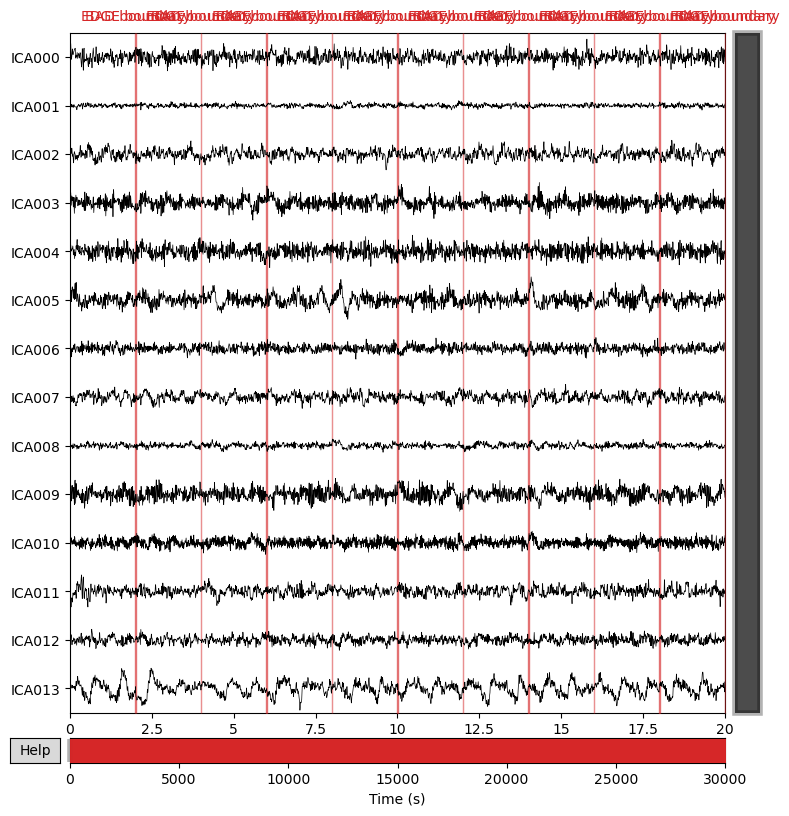

Plotting ICA components...


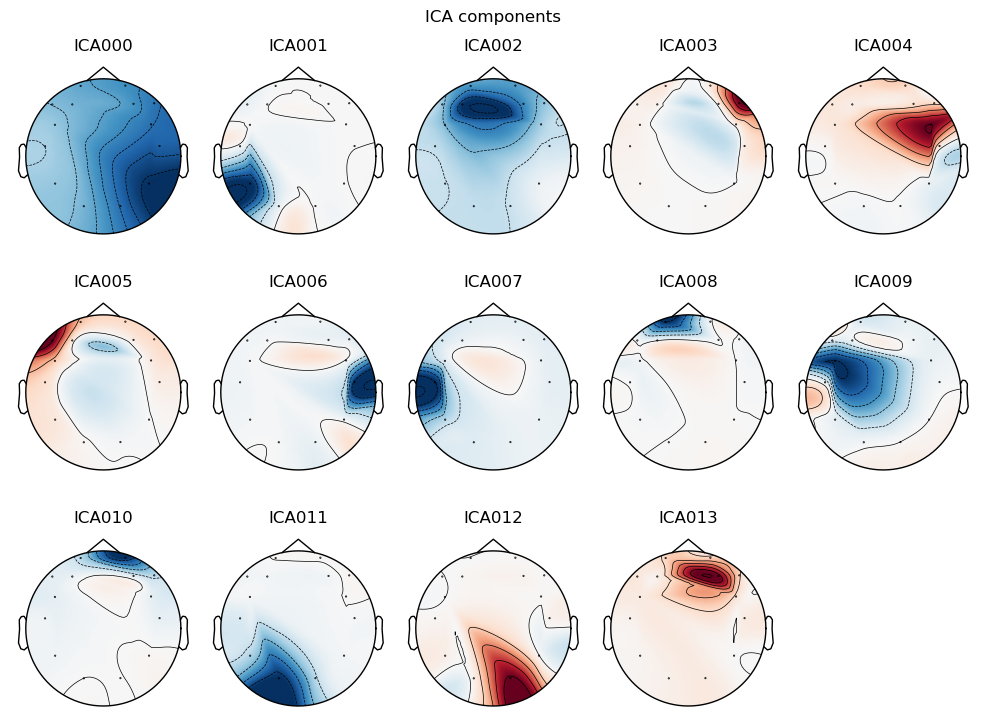

Labeling components via ICLabel...


/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(inst=data, ica=ica, method="iclabel")
/tmp/ipykernel_56234/3997149820.py:14: RuntimeWarning: The provided ICA instance was fitted with a 'picard' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance wi


 ICA Component Index ↔ Label:
 - ICA000: brain
 - ICA001: other
 - ICA002: brain
 - ICA003: other
 - ICA004: other
 - ICA005: other
 - ICA006: other
 - ICA007: brain
 - ICA008: eye blink
 - ICA009: other
 - ICA010: eye blink
 - ICA011: brain
 - ICA012: brain
 - ICA013: brain

 ICA Component Label Breakdown:
 - brain     : 6 components
 - other     : 6 components
 - eye blink : 2 components

Plotting imagined digit 6 — Trial 0


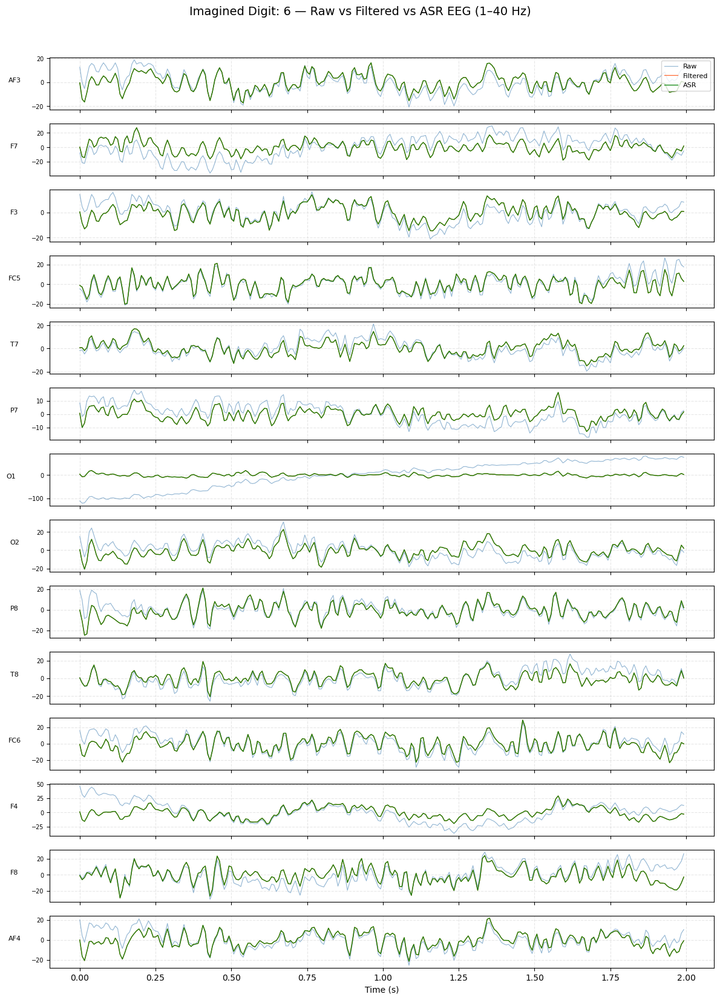

In [33]:
# === Select 1000 random trials for ASR calibration (from filtered EEG) ===
flat = x_data_filtered.reshape(len(x_data_filtered), -1)
stds = np.std(flat, axis=1)
ptp = np.ptp(flat, axis=1)

# Stable trials only
kurt = kurtosis(flat, axis=1)
good_indices = np.where((stds > 1.0) & (stds < 100) & (ptp < 300) & (np.abs(kurt) < 5))[0]
print(f"Found {len(good_indices)} good trials for ASR calibration")

if len(good_indices) < 1000:
    raise RuntimeError("Not enough clean calibration trials found.")

# Randomly pick 1000 from stable trials (not just lowest std)
calib_idx = np.random.choice(good_indices, size=1000, replace=False)
calib_data = np.concatenate([x_data_filtered[i] for i in calib_idx], axis=1)

# === Calibrate ASR ===
asr = ASR(sfreq=FS, cutoff=5.0) 
asr.fit(calib_data)
print("ASR calibration complete")

# === Apply ASR to all bandpass-filtered trials ===
x_data_asr = []
deltas = []
failed_trials = []
print("Applying ASR to all trials...")
for i in tqdm(range(len(x_data_filtered)), desc="ASR Cleaning"):
    try:
        cleaned = asr.transform(x_data_filtered[i])
        x_data_asr.append(cleaned)

        delta = np.mean(np.abs(cleaned - x_data_filtered[i]))
        deltas.append(delta)
        if delta > 5.0:
            print(f"Trial {i:05d} changed significantly (Δ = {delta:.2f} µV)")
    except Exception as e:
        print(f"Trial {i} failed: {e} → excluding")
        failed_trials.append(i)
        continue

x_data_asr = np.stack(x_data_asr)
np.save("raw_filtered_asr.npy", x_data_asr)
print("Saved ASR-cleaned EEG to 'raw_filtered_asr.npy'")
print("Mean ASR delta:", np.mean(deltas))

# === Run ICA on subset of ASR-cleaned trials ===
raw_list = [to_mne_raw(x_data_asr[i], CHANNEL_NAMES, FS) for i in range(N_ICA_TRIALS)]
raw_all = mne.concatenate_raws(raw_list)
raw_all.set_eeg_reference('average', projection=True)

ica_obj, ic_labels, label_dict = apply_ICA(
    raw_all,
    n_components=14,
    method='picard',
    random_state=245234,
    plot_picks=[0]
)

# === Optional: Visualize one trial ===
digit = 6
digit_indices = np.where(y_data == digit)[0]
if len(digit_indices) == 0:
    raise ValueError("No trials found for imagined digit 6.")

trial_idx = digit_indices[0]
print(f"\nPlotting imagined digit {digit} — Trial {trial_idx}")

plot_all_channels_eeg(
    x_raw=x_data_detrended,
    x_filt=x_data_filtered,
    x_asr=x_data_asr,
    trial_index=trial_idx,
    channel_names=CHANNEL_NAMES,
    fs=FS,
    duration_sec=2,
    y_labels=y_data
)
